**[Machine learning course project - 2020/2021 - Daniele Filippini - Alma Mater Studiorum University of Bologna]**


![AIcrowd-Logo](https://raw.githubusercontent.com/AIcrowd/AIcrowd/master/app/assets/images/misc/aicrowd-horizontal.png)


# **Food Recognition Challenge By AICrowd**


*   Given Images of Food, we are asked to provide **Instance Segmentation** over the images for the food items.
*   The Training Data is provided in the **COCO format**, making it simpler to load with pre-available COCO data processors in popular libraries.
*   The test set provided in the public dataset is the same to Validation set.


***For more information, check [the AIcrowd Challenge page](https://www.aicrowd.com/challenges/food-recognition-challenge)


## **Connection with Google Drive**

Google Drive is needed because new data relative to training (e.g. checkpoints), inference and testing(e.g. predictions) time are stored on it.

In [ ]:
import os, sys
print(sys.path)

['', '/content', '/env/python', '/usr/lib/python37.zip', '/usr/lib/python3.7', '/usr/lib/python3.7/lib-dynload', '/usr/local/lib/python3.7/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.7/dist-packages/IPython/extensions', '/root/.ipython']


In [ ]:
# list of packages installed
!pip list

Package                       Version       
----------------------------- --------------
absl-py                       0.12.0        
alabaster                     0.7.12        
albumentations                0.1.12        
altair                        4.1.0         
appdirs                       1.4.4         
argon2-cffi                   20.1.0        
arviz                         0.11.2        
astor                         0.8.1         
astropy                       4.2.1         
astunparse                    1.6.3         
async-generator               1.10          
atari-py                      0.2.6         
atomicwrites                  1.4.0         
attrs                         21.2.0        
audioread                     2.1.9         
autograd                      1.3           
Babel                         2.9.1         
backcall                      0.2.0         
beautifulsoup4                4.6.3         
bleach                        3.3.0         
blis      

In [ ]:
# Mount google drive
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# check installed packages
import pkg_resources

def check_installation(package_name):
  """
  This function check if a specific package is isntalled
  :param package_name (string): name of the package
  """
  try:
    cool_package_dist_info = pkg_resources.get_distribution(package_name)
  except pkg_resources.DistributionNotFound:
    print('{} not installed'.format(package_name))
    return False
  else:
    print(package_name, " already installed: ", cool_package_dist_info)
    return True

# required = {'torchf', 'numpy'}
# installed = {pkg.key for pkg in pkg_resources.working_set}
# missing = required - installed
# print("req", required)
# print("installed", installed)
# print("missing", missing)

## **Install Dependences**

*   install MMDetection
*   install related and needed libraries



In [ ]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
#check gpu
!nvidia-smi

Mon May 24 16:42:29 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# install dependencies:
!pip install -U torch==1.7.0+cu110 torchvision==0.8.1+cu110 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
if not check_installation("mmcv-full"):
  !pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu110/torch1.7.0/index.html
  #!pip install mmcv-full

# Install mmdetection (it takes ~15 minutes)
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
if not check_installation("mmdet"):
  !pip install -e .

# install Pillow 7.0.0 back in order to avoid bug in colab
if not check_installation("Pillow"):
  !pip install Pillow==7.0.0

# install cython needed for pycocotools
if not (check_installation("cython") and check_installation("pyyaml")):
  !pip install cython pyyaml==5.1

print("DONE")

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |███████████████████████▌        | 834.1MB 1.4MB/s eta 0:03:35tcmalloc: large alloc 1147494400 bytes == 0x562e5d0c4000 @  0x7f4d95baf615 0x562e23103cdc 0x562e231e352a 0x562e23106afd 0x562e231f7fed 0x562e2317a988 0x562e231754ae 0x562e231083ea 0x562e2317a7f0 0x562e231754ae 0x562e231083ea 0x562e2317732a 0x562e231f8e36 0x562e23176853 0x562e231f8e36 0x562e23176853 0x562e231f8e36 0x562e23176853 0x562e231f8e36 0x562e2327b3e1 0x562e231db6a9 0x562e23146cc4 0x562e23107559 0x562e2317b4f8 0x562e2310830a 0x562e231763b5 0x562e231757ad 0x562e231083ea 0x562e231763b5 0x562e2310830a 0x562e231763b5
     |█████████████████████████████▊  | 1055.7MB 1.2MB/s eta 0:01:10tcmalloc: large alloc 1434370048 bytes == 0x562ea171a000 @  0x7f4d95baf615 0x562e23103cdc 0x562e231e352a 0x562e23106afd 0x562e231f7fed 0x562e2317a988 0x562e231754ae 0x562e231083ea 0x562e2317a7f0 0x562e231754ae 0x562e231083ea 0x562e2317732a 0x562e231f8e36 0x562e23176853 0

**Needed to restart runtime before installing mmpycocotools**

---



In [ ]:
# Important -> IN CASE OF ERROR RUN IT 2 TIMES!!!
# install mmpycocotools -> version of pycocotools forked by open-mmlab repository
!pip install --force-reinstall pycocotools@git+https://github.com/open-mmlab/cocoapi.git#subdirectory=pycocotools

  Cloning https://github.com/open-mmlab/cocoapi.git to /tmp/pip-install-yfffm6js/pycocotools
  Running command git clone -q https://github.com/open-mmlab/cocoapi.git /tmp/pip-install-yfffm6js/pycocotools
  Using cached https://files.pythonhosted.org/packages/4e/78/56aa1b5f4d8ac548755ae767d84f0be54fdd9d404197a3d9e4659d272348/setuptools-57.0.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/0c/15/cca3ac44776df9ee27286941315dd8b14a598e8d80970200d05f720b9274/Cython-0.29.23-cp37-cp37m-manylinux1_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/24/33/5568d443ba438d95d4db635dd69958056f087e57e1026bee56f959d53f9d/matplotlib-3.4.2-cp37-cp37m-manylinux1_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/d4/70/d60450c3dd48ef87586924207ae8907090de0b306af2bce5d134d78615cb/python_dateutil-2.8.1-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/8a/bb/488841f56197b13700afd5658fc279a2025a39e22449b7cf29864669b15d/pyparsing-

In [ ]:
# for data visualization
!pip install seaborn
# for data preprocessing
!pip install --upgrade albumentations
# for results analysis using TIDE
#!pip install tidecv
# updated version of TIDE
!pip install git+https://github.com/wtiandong/tide.git
# need to modify wrong indentation in the tide library
!pip install autopep8
!autopep8 -i /usr/local/lib/python3.7/dist-packages/tidecv/ap.py
!autopep8 -i /usr/local/lib/python3.7/dist-packages/tidecv/quantify.py

     |████████████████████████████████| 81kB 9.1MB/s 
     |████████████████████████████████| 38.2MB 78kB/s 
     |████████████████████████████████| 952kB 42.0MB/s 
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12
  Cloning https://github.com/wtiandong/tide.git to /tmp/pip-req-build-wcyrjqfg
  Running command git clone -q https://github.com/wtiandong/tide.git /tmp/pip-req-build-wcyrjqfg
  Created wheel for tidecv: filename=tidecv-1.0.1-cp37-none-any.whl size=26195 sha256=c89569fd252519c8d6687a9427979597b4a183c8d2d23249cfbf564dafdbaea4
  Stored in directory: /tmp/pip-ephem-wheel-cache-_x5u_8b5/wheels/f8/92/5c/1966785460a6c91e18c53012da01c706d981d7948970781a13
Successfully built tidecv
     |████████████████████████████████| 51kB 7.2MB/s 
     |███████████████████████████████

In [ ]:
# clone my github repo in which there are the config files and the checkpoints
!git clone https://github.com/daniele22/food-recognition.git

Cloning into 'food-recognition'...
remote: Enumerating objects: 236, done.
remote: Counting objects: 100% (236/236), done.
remote: Compressing objects: 100% (163/163), done.
remote: Total 236 (delta 123), reused 177 (delta 65), pack-reused 0
Receiving objects: 100% (236/236), 1.83 MiB | 29.77 MiB/s, done.
Resolving deltas: 100% (123/123), done.


Install `flask-ngrok`. This package is necessary to serve the web application on Colab.

In [ ]:
if not check_installation("flask-ngrok"):  # used to serve the web application on colab
  !pip install flask-ngrok

flask-ngrok not installed


Install the web application's requirements

In [ ]:
!pip install -r food-recognition/requirements.txt 

     |████████████████████████████████| 163kB 26.4MB/s 
     |████████████████████████████████| 204kB 24.9MB/s 


Install git large file storer to load checkpoint data.

In [ ]:
#!sudo apt-get install git-lfs
#!git lfs fetch

**Need to RESTART RUNTIME prior to this, to let your installation take effect**


---



# **Import dependences**

In [ ]:
# clone my github repo in which there are the config files and the checkpoints
!git clone https://github.com/daniele22/food-recognition.git

Cloning into 'food-recognition'...
remote: Enumerating objects: 236, done.
remote: Counting objects: 100% (236/236), done.
remote: Compressing objects: 100% (163/163), done.
remote: Total 236 (delta 123), reused 177 (delta 65), pack-reused 0
Receiving objects: 100% (236/236), 1.83 MiB | 34.10 MiB/s, done.
Resolving deltas: 100% (123/123), done.


In [ ]:
# Check Pytorch installation
import torch, torchvision
print("Torch version: ", torch.__version__)
print("Cuda is available: ", torch.cuda.is_available())
print("Number of GPUs available: ", torch.cuda.device_count())

# Check MMDetection installation
import mmdet
print("mmdetection version: ", mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print("Cuda version: ", get_compiling_cuda_version())
print("GCC version: ", get_compiler_version())

Torch version:  1.7.0+cu110
Cuda is available:  True
Number of GPUs available:  1
mmdetection version:  2.12.0
Cuda version:  11.0
GCC version:  GCC 7.3


In [ ]:
# Import libraries

# import some common libraries
import numpy as np
import pandas as pd
import cv2
import json
from tqdm.notebook import tqdm
import argparse
import base64
import glob

# For reading annotations file
from pycocotools.coco import COCO
from pycocotools import coco, cocoeval, _mask
from pycocotools import mask as maskUtils 
from pycocotools.cocoeval import COCOeval
import pycocotools.mask as maskUtils
# Import the TIDE evaluation toolkit
from tidecv import TIDE, datasets

# utilities
from pprint import pprint # For beautiful print!
import os
import sys
import random
import pickle

# For data visualisation
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib import colors
import plotly.graph_objects as go
import plotly.express as px
from google.colab.patches import cv2_imshow
import skimage.io as io
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import seaborn as sns
matplotlib.use('Agg')
# For visualize figure inline in notebooks
%matplotlib inline

### Modify library function

This is a modification of the showAnns function of the pycocotools library needed for a better visualization of the reuslts.

In [ ]:
# Perform a monkey patching of the class method. Differently from the first method, it changes the behavior of any instance of the class (https://stackoverflow.com/questions/50599045/python-replacing-a-function-within-a-class-of-a-module)
# This is a modification of the showanns function of the pycocotools library
def showAnns(self, anns, draw_bbox=False, dotted_bbox=False, color_list=[], draw_mask=True):
        """
        Display the specified annotations.
        :param anns (array of object): annotations to display
        :param draw_bbox (boolean): True=display the bbox, False=don't show bbox
        :param dotted_bbox (bool): specify the layout style of the bboxes. True -> 'dotted' and False -> 'full'. Dotted means bbox with empty face and dotted border, Full means face full and solid line (as for masks)
        :param color_list (list): list of colors used for the different bboxes and masks (use matplotlib named colors https://matplotlib.org/3.1.0/gallery/color/named_colors.html#sphx-glr-gallery-color-named-colors-py)
        if color_list is empty or the number of polygons is greater than the number of colors in input, random color will be used.
        :return: None
        """
        if len(anns) == 0:
            return 0
        if 'segmentation' in anns[0] or 'keypoints' in anns[0] or 'bbox' in anns[0]:
            datasetType = 'instances'
        elif 'caption' in anns[0]:
            datasetType = 'captions'
        else:
            raise Exception('datasetType not supported')
        if datasetType == 'instances':
            ax = plt.gca()
            ax.set_autoscale_on(False)
            polygons = []
            color = []
            polygons_bbox = []
            color_bbox = []
            no_color_in_input = len(color_list)
            for i, ann in enumerate(anns):
                
                if no_color_in_input > i:
                  c = colors.to_rgb(color_list[i])  # use color from list in input
                else:
                  c = (np.random.random((1, 3))*0.6+0.4).tolist()[0]  # use random color

                if 'segmentation' in ann and draw_mask:
                    if type(ann['segmentation']) == list:
                        # polygon
                        for seg in ann['segmentation']:
                            poly = np.array(seg).reshape((int(len(seg)/2), 2))
                            polygons.append(Polygon(poly))
                            color.append(c)
                    else:
                        # mask
                        t = self.imgs[ann['image_id']]
                        if type(ann['segmentation']['counts']) == list:
                            rle = maskUtils.frPyObjects([ann['segmentation']], t['height'], t['width'])
                        else:
                            rle = [ann['segmentation']]
                        m = maskUtils.decode(rle)
                        img = np.ones( (m.shape[0], m.shape[1], 3) )
                        if ann['iscrowd'] == 1:
                            color_mask = np.array([2.0,166.0,101.0])/255
                        if ann['iscrowd'] == 0:
                            color_mask = np.random.random((1, 3)).tolist()[0]
                        for i in range(3):
                            img[:,:,i] = color_mask[i]
                        ax.imshow(np.dstack( (img, m*0.5) ))
                if 'keypoints' in ann and type(ann['keypoints']) == list:
                    # turn skeleton into zero-based index
                    sks = np.array(self.loadCats(ann['category_id'])[0]['skeleton'])-1
                    kp = np.array(ann['keypoints'])
                    x = kp[0::3]
                    y = kp[1::3]
                    v = kp[2::3]
                    for sk in sks:
                        if np.all(v[sk]>0):
                            plt.plot(x[sk],y[sk], linewidth=3, color=c)
                    plt.plot(x[v>0], y[v>0],'o',markersize=8, markerfacecolor=c, markeredgecolor='k',markeredgewidth=2)
                    plt.plot(x[v>1], y[v>1],'o',markersize=8, markerfacecolor=c, markeredgecolor=c, markeredgewidth=2)

                if draw_bbox:
                    [bbox_x, bbox_y, bbox_w, bbox_h] = ann['bbox']
                    poly = [[bbox_x, bbox_y], [bbox_x, bbox_y+bbox_h], [bbox_x+bbox_w, bbox_y+bbox_h], [bbox_x+bbox_w, bbox_y]]
                    np_poly = np.array(poly).reshape((4,2))
                    polygons_bbox.append(Polygon(np_poly))
                    color_bbox.append(c)
            
            # add mask patches (full style)
            p = PatchCollection(polygons, facecolor=color, linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection(polygons, facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
            # add bbox patches
            if dotted_bbox:  # dotted style
              p = PatchCollection(polygons_bbox, facecolor='none', edgecolors=color_bbox, linewidths=2, linestyle='--')
              ax.add_collection(p)
            else:  # full style
              p = PatchCollection(polygons_bbox, facecolor=color_bbox, linewidths=0, alpha=0.4)
              ax.add_collection(p)
              p = PatchCollection(polygons_bbox, facecolor='none', edgecolors=color_bbox, linewidths=2)
              ax.add_collection(p)

        elif datasetType == 'captions':
            for ann in anns:
                print(ann['caption'])
COCO.showAnns = showAnns

This is a modification of the get_confusion_matrix function of the tide library

In [ ]:
# Modification of the confusion matrix function of the tide library to remove an error
from tidecv.errors.main_errors import *
from tidecv import plotting as P
def get_confusion_matrix(self, annotations_data):

    # add function to get the position in the list of a specific category
    def _get_cat_position(annotations_data, specific_id):
      cat_list = val_annotations_data["categories"]
      index = next((i for i, item in enumerate(cat_list) if item["id"] == specific_id), -1)
      return index

    confusion_matrix = {}
    for run_name, run in self.runs.items():
      n_classes = len(run.gt.classes)
      #row: predicted classes, col: actual classes
      cm = np.zeros((n_classes, n_classes), dtype=np.int32)
      for error in run.errors:
        if isinstance(error, ClassError):
          # error.pred['class'] return the class_id, so we use the _get_cat_position function to obtain the position in range [0, #classes]
          cm[_get_cat_position(annotations_data, error.pred['class'])][_get_cat_position(annotations_data, error.gt['class'])] += 1
      confusion_matrix[run_name] = cm
      sorted_keys = sorted(run.gt.classes.keys())
      print()

      P.print_table([
        ['pred/gt'] + [run.gt.classes[k] for k in sorted_keys],
      ] + [
        [run.gt.classes[k]] + [str(cnt) for cnt in cm[i]] for i, k in enumerate(sorted_keys)
      ], title=f"{run_name} confusion matrix")

    return confusion_matrix

TIDE.get_confusion_matrix = get_confusion_matrix

### Utils

Define some function useful in the rest of the notebook

In [ ]:
def getClassNameReadable(coco_data, annotations_data, cat_id):
  """
  the function takes the coco data and the id of a specific category
  and return the name of the category in readable format
  :param coco_data: coco obj create with COCO fun
  :param annotations_data: annotations from annotation json file in coco format
  :param cat_id: category id from annotations
  :return 'name_readable' from annotation
  """
  cats = coco_data.loadCats(ids=[cat_id])
  name = [cat['name_readable'] for cat in cats]
  return name

def getClassName(coco_data, annotations_data, cat_id):
  """
  the function takes the coco data and the id of a specific category
  and return the name of the category in readable format
  :param coco_data: coco obj create with COCO fun
  :param annotations_data: annotations from annotation json file in coco format
  :param cat_id: category id from annotations
  :return 'name' from annotation  (not in redable format!)
  """
  cats = coco_data.loadCats(ids=[cat_id])
  name = [cat['name'] for cat in cats]
  return name

# **Notebook variablas constants and params configuration**

Set the processing to apply:


*   get_data_fom_url: specifies how to get the datasets
  * True -> download file from aicrowd urls source;
  * False -> get data from google drive repository
*   do_imgs_fix_by_adjusting: how to deal with incorrect images that we need to modify or remove
  * True -> adjust the images by flipping height and width;
  * False -> delete incorrect imgs
* do_bbox_modification: specifies if we want or not modify the bbox annotations
  * True -> update bboxes using masks info;
  * False -> use pre-defined bboxes info



In [ ]:
# set configuration on which code to execute 
get_data_from_urls = False  # True -> download file from aicrowd urls source, False -> get data from my google drive repository
do_imgs_fix_by_adjusting = True  # True -> adjust the images by flipping height and width, False -> delete incorrect imgs
do_bbox_modification = True  # True -> update bboxes using masks info, False -> use pre-defined bboxes info

File paths constants:

In [ ]:
# training set path
TRAIN_ANNOTATIONS_PATH = "./data/train/annotations.json"
TRAIN_IMAGE_DIRECTORY = "./data/train/images/"

# validation set path
VAL_ANNOTATIONS_PATH = "./data/val/annotations.json"
VAL_IMAGE_DIRECTORY = "./data/val/images/"

# fixed annotation files by adjusting the imgs with wrong masks
ADJ_FIXED_ANN_FILENAME = "fixed_annotations_adjust.json"
TRAIN_FIXED_ANNOTATIONS_PATH_ADJUST = "./data/train/fixed_annotations_adjust.json"
VAL_FIXED_ANNOTATIONS_PATH_ADJUST = "./data/val/fixed_annotations_adjust.json"

# fixed annotation files by removing (delete) the imgs with wrong masks
DEL_FIXED_ANN_FILENAME = "fixed_annotations_del.json"
TRAIN_FIXED_ANNOTATIONS_PATH_DEL = "./data/train/fixed_annotations_del.json"
VAL_FIXED_ANNOTATIONS_PATH_DEL = "./data/val/fixed_annotations_del.json"

# fixed annotations files after bbox modification
BBOX_FIXED_ANN_FILENAME = "fixed_annotations_bbox.json"
TRAIN_FIXED_ANNOTATIONS_BBOX_PATH = "./data/train/fixed_annotations_bbox.json"
VAL_FIXED_ANNOTATIONS_BBOX_PATH = "./data/val/fixed_annotations_bbox.json"

Variables needed to save and load the files:

In [ ]:
# needed for fixing bbox and loading data
if do_imgs_fix_by_adjusting:
  train_fixed_annotation_path = TRAIN_FIXED_ANNOTATIONS_PATH_ADJUST
  val_fixed_annotation_path = VAL_FIXED_ANNOTATIONS_PATH_ADJUST
else:
  train_fixed_annotation_path = TRAIN_FIXED_ANNOTATIONS_PATH_DEL
  val_fixed_annotation_path = VAL_FIXED_ANNOTATIONS_PATH_DEL

# file name needed in model config (dataset section)
if do_bbox_modification:
  final_annotation_filename = BBOX_FIXED_ANN_FILENAME
elif do_imgs_fix_by_adjusting:
  final_annotation_filename = ADJ_FIXED_ANN_FILENAME
else: 
  final_annotation_filename = DEL_FIXED_ANN_FILENAME

# **Downloading & Unzipping our Dataset**

Download train, val and test dataset from aicrowd challenge or get them from google drive repository

Note that val and test contains the same imgs, therefore we download only the validation set.

So, the data structure is something like this (The zip files are present only in the case that the dataset are download from urls sources)

```
content
|
└─── sample_data
|
└─── data
|    |
|    └─── Train 
|    │   │   annotations.json
|    │   └───images
|    │       │   012170.jpg
|    │       │   012030.jpg
|    │       │   ...
|    │   
|    └─── val
|        │   annotations.json
|        └───images
|           │   011397.jpg
|           │   012340.jpg
|           │   ...
|
|    train.zip 
|    val.zip
|    test.zip
```

In [ ]:
if get_data_from_urls:  # True -> get data from aicrowd, False -> get data from google drive
  # Download the data from URLs
  print("Downloading data from aicrowd public dataset....")
  if not os.path.exists("data"):
    !mkdir data
    !mkdir data/train
    !mkdir data/val

  if not os.path.exists("data/train/images"):
    !wget https://datasets.aicrowd.com/default/aicrowd-public-datasets/food-recognition-challenge/v0.4/train-v0.4.tar.gz
    !unzip -q train-v0.4.tar.gz -d ./data

  if not os.path.exists("data/val/images"):
    !wget https://datasets.aicrowd.com/default/aicrowd-public-datasets/food-recognition-challenge/v0.4/val-v0.4.tar.gz
    !unzip -q val-v0.4.tar.gz -d ./data
else:
  # Get the dataset from my google drive where i have uploaded the dataset
  print("Getting data from google drive repo.....")
  import zipfile

  # extract train
  zip_ref = zipfile.ZipFile("/content/drive/My Drive/ML/FoodAicrowdDataset/train.zip", 'r')
  zip_ref.extractall("./data")
  zip_ref.close()

  # extract val
  zip_ref = zipfile.ZipFile("/content/drive/My Drive/ML/FoodAicrowdDataset/val.zip", 'r')
  zip_ref.extractall("./data")
  zip_ref.close()

Getting data from google drive repo.....


## Reading the data

In [ ]:
# load data using cocoapi
print("Loading training data........................................................")
train_coco = COCO(TRAIN_ANNOTATIONS_PATH)
print("Loading validation data........................................................")
val_coco = COCO(VAL_ANNOTATIONS_PATH)

Loading training data........................................................
loading annotations into memory...
Done (t=1.63s)
creating index...
index created!
Loading validation data........................................................
loading annotations into memory...
Done (t=0.07s)
creating index...
index created!


In [ ]:
# Reading the annotation files
with open(TRAIN_ANNOTATIONS_PATH) as f:
  train_annotations_data = json.load(f)
  print("ok train annotations.")

with open(VAL_ANNOTATIONS_PATH) as f:
  val_annotations_data = json.load(f)
  print("ok validation annotations.")

ok train annotations.
ok validation annotations.


In [ ]:
# Some inofmrations to check if we have corrected loaded the files
print("Keys of train annotation file: ", train_annotations_data.keys())
print("Number of Categories(Classes) present: ", len(train_annotations_data['categories']))

Keys of train annotation file:  dict_keys(['categories', 'info', 'images', 'annotations'])
Number of Categories(Classes) present:  273


**Data Format**

Our COCO data format is something like this:

```
"info": {...},
"categories": [...],
"images": [...],
"annotations": [...],
```

In which **categories** is like this:
```
[
  {
    'id': 2578,
    'name': 'water',
    'name_readable': 'Water',
    'supercategory': 'food'
  },
  {
    'id': 1157,
    'name': 'pear',
    'name_readable': 'Pear',
    'supercategory': 'food'
  },
  ...
  {
    'id': 1190,
    'name': 'peach',
    'name_readable': 'Peach',
    'supercategory': 'food'
  }
]
```

**Info** is empty ( not sure why ), usually it contains info about the dataset.

**Images** is like this:

```
[
  {
    'file_name': '065537.jpg', 
    'height': 464, 
    'id': 65537, 
    'width': 464
  },
  {
    'file_name': '065539.jpg', 
    'height': 464, 
    'id': 65539, 
    'width': 464
  },
  ...
  {
    'file_name': '069900.jpg', 
    'height': 391, 
    'id': 69900, 
    'width': 392
  },
]
```
**Annotations** is like this:

Note: regions of interest indicated by these annotations are specified by “segmentations”, which are usually a list of polygon vertices around the object.

```
{
  'area': 44320.0,
  'bbox': [86.5, 127.49999999999999, 286.0, 170.0], # The COCO bounding box format is [X top-left, Y top-left, width, height].
  'category_id': 2578,
  'id': 102434,
  'image_id': 65537,
  'iscrowd': 0,
  'segmentation': [[235.99999999999997,
                    372.5,
                    169.0,
                    372.5,
                    ...
                    368.5,
                    264.0,
                    371.5]]
}
```


In [ ]:
# Reading all classes
category_info = train_coco.loadCats(train_coco.getCatIds())
category_names = [_["name"] for _ in category_info]
category_names_readable = [_["name_readable"] for _ in category_info]
no_categories = len(category_names)

pprint(", ".join(category_names_readable))
# print("Number of categories ", no_categories)

('Water, Pear, Egg, Grapes, Butter, Bread, white, Jam, Bread, whole wheat, '
 'Apple, Tea, green, White coffee, with caffeine, Tea, black, Mixed salad '
 '(chopped without sauce), Cheese, Tomato sauce, Pasta, spaghetti, Carrot, '
 'Onion, Beef, cut into stripes (only meat), Rice noodles/vermicelli, Salad, '
 'leaf / salad, green, Bread, grain, Espresso, with caffeine, Banana, Mixed '
 'vegetables, Bread, wholemeal, Savoury puff pastry, Wine, white, Dried meat, '
 'Fresh cheese, Red radish, Hard cheese, Ham, raw, Bread, fruit, Oil & vinegar '
 'salad dressing, Tomato, Cauliflower, Potato-gnocchi, Wine, red, Sauce, '
 'cream, Pasta, linguini, parpadelle, Tagliatelle, French beans, Almonds, Dark '
 'chocolate, Mandarine, Semi-hard cheese, Croissant, Sushi, Berries, Biscuits, '
 'Thickened cream (> 35%), Corn, Celeriac, Alfa sprouts, Chickpeas, Leaf '
 'spinach, Rice, Chocolate cookies, Pineapple, Tart, Coffee, with caffeine, '
 'Focaccia, Pizza, with vegetables, baked, Soup, vegetable, Br

In [ ]:
# Getting all categoriy with respective to their total images
def getImgsInfos(coco_data):
  """
  function that return all the informations relative to the imgs in a pandas dataframe
  :param coco_data: data in COCO format using pycocotools library function
  :return {no_images_per_category, img_info} where no_images_per_category is a object of type {cat_name: no_of_img}
  and img_info is the pandas df containing the images annotation info
  """
  no_images_per_category = {}
  tot_img = 0
  for n, i in enumerate(coco_data.getCatIds()):
    imgIds = coco_data.getImgIds(catIds=i)
    label = category_names[n]
    no_images_per_category[label] = len(imgIds)
    tot_img = tot_img + len(imgIds)
  # build dataframe with the images informations
  img_info = pd.DataFrame(coco_data.loadImgs(coco_data.getImgIds()))

  # show results
  print("Total = ", tot_img) # the total correspond to the number of annotations not of the images
  print("Number of images per category:")
  pprint(no_images_per_category)

  return no_images_per_category, img_info

# training set info
no_images_per_category_train, img_info_train = getImgsInfos(train_coco)

Total =  39207
Number of images per category:
{'alfa-sprouts': 40,
 'almonds': 159,
 'apple': 504,
 'apple-pie': 104,
 'applesauce-unsweetened-canned': 39,
 'apricots': 91,
 'artichoke': 43,
 'avocado': 296,
 'bacon-cooking': 47,
 'bacon-frying': 127,
 'balsamic-salad-dressing': 117,
 'banana': 412,
 'beans-kidney': 40,
 'beef': 85,
 'beef-cut-into-stripes-only-meat': 41,
 'beef-filet': 51,
 'beef-minced-only-meat': 65,
 'beef-sirloin-steak': 41,
 'beer': 158,
 'beetroot-raw': 45,
 'beetroot-steamed-without-addition-of-salt': 91,
 'berries': 64,
 'bircherma1-4esli-prepared-no-sugar-added': 96,
 'biscuits': 134,
 'black-olives': 132,
 'blue-mould-cheese': 68,
 'blueberries': 159,
 'boisson-au-glucose-50g': 171,
 'bolognaise-sauce': 87,
 'braided-white-loaf': 194,
 'bread': 63,
 'bread-5-grain': 48,
 'bread-black': 54,
 'bread-french-white-flour': 121,
 'bread-fruit': 48,
 'bread-grain': 102,
 'bread-half-white': 76,
 'bread-nut': 57,
 'bread-pita': 38,
 'bread-rye': 47,
 'bread-sourdoug

In [ ]:
# validation set info
no_images_per_category_val, img_info_val = getImgsInfos(val_coco)

Total =  2047
Number of images per category:
{'alfa-sprouts': 1,
 'almonds': 10,
 'apple': 38,
 'apple-pie': 6,
 'applesauce-unsweetened-canned': 3,
 'apricots': 4,
 'artichoke': 6,
 'avocado': 19,
 'bacon-cooking': 5,
 'bacon-frying': 4,
 'balsamic-salad-dressing': 5,
 'banana': 28,
 'beans-kidney': 1,
 'beef': 3,
 'beef-cut-into-stripes-only-meat': 5,
 'beef-filet': 2,
 'beef-minced-only-meat': 5,
 'beef-sirloin-steak': 4,
 'beer': 8,
 'beetroot-raw': 5,
 'beetroot-steamed-without-addition-of-salt': 2,
 'berries': 3,
 'bircherma1-4esli-prepared-no-sugar-added': 5,
 'biscuits': 13,
 'black-olives': 8,
 'blue-mould-cheese': 2,
 'blueberries': 7,
 'boisson-au-glucose-50g': 11,
 'bolognaise-sauce': 9,
 'braided-white-loaf': 5,
 'bread': 4,
 'bread-5-grain': 6,
 'bread-black': 4,
 'bread-french-white-flour': 4,
 'bread-fruit': 3,
 'bread-grain': 7,
 'bread-half-white': 2,
 'bread-nut': 3,
 'bread-pita': 2,
 'bread-rye': 3,
 'bread-sourdough': 6,
 'bread-toast': 2,
 'bread-white': 65,
 'br

Reading 'annotations' part of coco data:

In [ ]:
# build dataframe with the images informations
ann_info_train = pd.DataFrame(train_coco.loadAnns(train_coco.getAnnIds()))
ann_info_val = pd.DataFrame(val_coco.loadAnns(val_coco.getAnnIds()))
print(ann_info_train.head())

       id  image_id  ...                                               bbox iscrowd
0  102434     65537  ...           [86.5, 127.49999999999999, 286.0, 170.0]       0
1  102437     65539  ...  [126.49999999999999, 126.49999999999999, 285.0...       0
2  102450     65561  ...                        [57.5, 138.5, 280.0, 173.0]       0
3  102456     65574  ...                         [41.5, 41.5, 751.0, 756.0]       0
4  102458     65577  ...                           [4.5, 4.5, 448.0, 473.0]       0

[5 rows x 7 columns]


### Skip Data Exploration+Preprocessing

---


To skip the data exploration, viuslization and preprocessing (fixing errors) parts we can optionally use the available fixed_annotations files in the drive folder (if are present).

In this way you can directly go to the "Train a detector on customized dataset using MMDetection" section.

In [ ]:
# Current path
import pathlib
pathlib.Path().absolute()

PosixPath('/content')

In [ ]:
print("EXISTS PATH: ",os.path.exists("./data/train/fixed_annotations_bbox_adjust.json"))
print("EXISTS FILE: ", os.path.isfile("./data/train/fixed_annotations_bbox_adjust.json"))

EXISTS PATH:  True
EXISTS FILE:  True


In [ ]:
# use the correct bbox file
if os.path.exists("./data/train/fixed_annotations_bbox_adjust.json"):
  # create the bbox final file
  if do_bbox_modification:
    if do_imgs_fix_by_adjusting:
      !cp ./data/train/fixed_annotations_bbox_adjust.json ./data/train/fixed_annotations_bbox.json
      !cp ./data/val/fixed_annotations_bbox_adjust.json ./data/val/fixed_annotations_bbox.json
    else:
      !cp ./data/train/fixed_annotations_bbox_delete.json ./data/train/fixed_annotations_bbox.json
      !cp ./data/val/fixed_annotations_bbox_delete.json ./data/val/fixed_annotations_bbox.json
else:
  print("Impossible to use the bbox correct annotations file from my drive.")

# Data Exploration

In this section we are going to read our dataset & doing some data visualisations 

In [ ]:
# The data are referred to the training set
print("Info about training set data:")
pprint(f"Average number of image per class : { sum(list(no_images_per_category_train.values())) / len(list(no_images_per_category_train.values())) }")
pprint(f"Highest number of image per class is : { list(no_images_per_category_train.keys())[0]} of { list(no_images_per_category_train.values())[0] }")
pprint(f"Lowest number of image per class is : Veggie Burger of { sorted(list(no_images_per_category_train.values()))[0] }")

Info about training set data:
'Average number of image per class : 143.6153846153846'
'Highest number of image per class is : water of 1835'
'Lowest number of image per class is : Veggie Burger of 35'


## Data visualization

In [ ]:
# Histogram with number of images per class
fig = go.Figure([go.Bar(x=list(no_images_per_category_train.keys()), y=list(no_images_per_category_train.values()))])
fig.update_layout(
    title="No of Image per class (training set)",)
fig.show()

In [ ]:
# Histogram with number of images per class
fig = go.Figure([go.Bar(x=list(no_images_per_category_val.keys()), y=list(no_images_per_category_val.values()))])
fig.update_layout(
    title="No of Image per class (validation set)",)
fig.show()

In [ ]:
# Pie chart with number of images per class
fig = go.Figure(data=[go.Pie(labels=list(no_images_per_category_train.keys()), values=list(no_images_per_category_train.values()), 
                             hole=.3, textposition='inside', )], )
fig.update_layout(
    title="No of Image per class ( Training set)",)
fig.show()

In [ ]:
# Height width histogram
fig = go.Figure()
fig.add_trace(go.Histogram(x=img_info_train['height'], name='Height'))
fig.add_trace(go.Histogram(x=img_info_train['width'], name='Width'))
# Overlay both histograms
fig.update_layout(barmode='stack', title="Histogram of Image width & height",)
fig.show()

In [ ]:
print("Average height", img_info_train['height'].mean())
print("Average width", img_info_train['width'].mean())

Average height 645.5505804311774
Average width 644.4447346600332


In [ ]:
print("Median of height", img_info_train['height'].median())
print("Median of width", img_info_train['width'].median())

Median of height 480.0
Median of width 480.0


In [ ]:
print("Height properties:")
print(img_info_train['height'].describe())

Height properties:
count    24120.000000
mean       645.550580
std        312.146769
min        183.000000
25%        478.000000
50%        480.000000
75%        852.000000
max       4096.000000
Name: height, dtype: float64


In [ ]:
print("Width properties:")
print(img_info_train['width'].describe())

Width properties:
count    24120.000000
mean       644.444735
std        301.716684
min        182.000000
25%        478.000000
50%        480.000000
75%        852.000000
max       4608.000000
Name: width, dtype: float64


In [ ]:
# Aspect ratio of images training set
asp_ratio = img_info_train['height'] / img_info_train['width']
print(asp_ratio.describe())

count    24120.000000
mean         1.000600
std          0.038638
min          0.418333
25%          0.998858
50%          1.000000
75%          1.000000
max          2.166667
dtype: float64


In [ ]:
# Plot aspect ratio training set images
fig = go.Figure()
fig.add_trace(go.Histogram(x=asp_ratio, name='Aspect ratio'))
fig.update_layout(title="Aspect ratio of images",)
fig.show()

In [ ]:
# number of objects per image
no_annotations_per_img = ann_info_train['image_id'].value_counts()
#print(no_annotations_per_img)
fig = go.Figure()
fig.add_trace(go.Histogram(x=no_annotations_per_img, name='Annotations per img'))
fig.update_layout(title="Number of objects per image",)
fig.show()

## Image Visulisation 🖼️

Show some images and info about them

In [ ]:
img_info_train

,id,file_name,width,height
0,65537,065537.jpg,464,464
1,65539,065539.jpg,464,464
2,65561,065561.jpg,464,464
3,65574,065574.jpg,831,830
4,65577,065577.jpg,480,480
...,...,...,...,...
24115,65500,065500.jpg,628,628
24116,65514,065514.jpg,1037,1036
24117,65516,065516.jpg,480,480
24118,65523,065523.jpg,480,480


In [ ]:
img_info_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24120 entries, 0 to 24119
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         24120 non-null  int64 
 1   file_name  24120 non-null  object
 2   width      24120 non-null  int64 
 3   height     24120 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 753.9+ KB


In [ ]:
# The “annotations” section is the trickiest to understand. 
# It contains a list of every individual object annotation from every image in the dataset. 
# For example, if there are 64 bicycles spread out across 100 images, there will be 64 bicycle annotations. 
# Often there will be multiple instances of an object in an image. 
# Usually this results in a new annotation item for each one.
print("Numer of annotations:", len(train_annotations_data['annotations']))
# Is Crowd specifies whether the segmentation is for a single object or for a group/cluster of objects.
print("Sum iscrowd = 0:", sum(1 for i in train_annotations_data['annotations'] if i['iscrowd'] == 0)) # Is not a crowd (meaning it’s a single object)
print("Sum iscrowd = 1:", sum(1 for i in train_annotations_data['annotations'] if i['iscrowd'] == 1)) # Is a crowd (meaning it’s a group of objects)

Numer of annotations: 39328
Sum iscrowd = 0: 39328
Sum iscrowd = 1: 0


In [ ]:
ann_info_train['area'].describe()

count    3.932800e+04
mean     9.983089e+04
std      1.938720e+05
min      0.000000e+00
25%      2.510575e+04
50%      5.426750e+04
75%      1.133440e+05
max      7.947275e+06
Name: area, dtype: float64

In [ ]:
train_annotations_data['annotations'][0]

{'area': 44320.0,
 'bbox': [86.5, 127.49999999999999, 286.0, 170.0],
 'category_id': 2578,
 'id': 102434,
 'image_id': 65537,
 'iscrowd': 0,
 'segmentation': [[235.99999999999997,
   372.5,
   169.0,
   372.5,
   163.0,
   370.5,
   155.5,
   360.0,
   140.5,
   295.0,
   127.49999999999999,
   172.0,
   128.5,
   110.0,
   134.5,
   97.0,
   141.0,
   92.5,
   173.0,
   86.5,
   240.00000000000003,
   83.5,
   266.0,
   86.5,
   284.0,
   92.5,
   290.5,
   99.0,
   297.5,
   138.0,
   297.5,
   232.0,
   284.5,
   341.0,
   277.5,
   363.0,
   273.0,
   368.5,
   264.0,
   371.5]]}

In some annotations there are multiple segments and the model could tends to predict them as separate instances instead of a single instance:

In [ ]:
# some segmentation have more that one single element
c = 0
for n, i in enumerate(tqdm((train_annotations_data['annotations']))):
  # print("----------------------------------------------")
  # print(n, "shape:", np.array(train_annotations_data['annotations'][n]['segmentation']).shape)
  # print(train_annotations_data['annotations'][n])
  if np.array(train_annotations_data['annotations'][n]['segmentation']).shape[0] != 1:
    print(n, "-", train_annotations_data['annotations'][n]['segmentation'])
    c = c+1

print("Total = ", c)

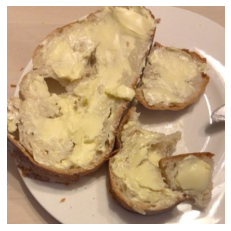

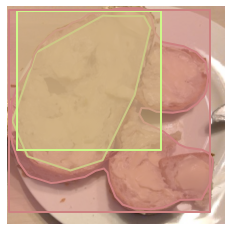

In [ ]:
def render_img_from_num(coco_data, annotations_data, img_number, img_folder_path, render_ann, show_bbox):
    """
    Plot an image with or without bbox and mask
    :param coco_data: coco obj create with COCO fun
    :param annotations_data: annotations from annotation json file in coco format
    :param img_number: number of the element in annotations['image'] list to visualize
    :param img_folder_path: path to img folder
    :param render_ann (bool): whether to render or not the mask
    :param show_bbox (bool): whether to render or not the bbox (bbox are rendered only if render_ann=True)
    :return None
    """
    # get img info
    my_img = annotations_data['images'][img_number]
    file_name = my_img['file_name']
    img_id = my_img['id']
    annIds = coco_data.getAnnIds(imgIds=[img_id])  # get annotations ids from image ids list
    anns = coco_data.loadAnns(annIds)  # get the entire annotations needed
    # load and render the image
    plt.imshow(plt.imread(img_folder_path + file_name))  # plot img
    plt.axis('off')
    # Render annotations on top of the image
    if render_ann:
        coco_data.showAnns(anns, draw_bbox=show_bbox)
    plt.show()

# Show an example of image with and without mask
num = 5
render_img_from_num(train_coco, train_annotations_data, img_number=num, img_folder_path=TRAIN_IMAGE_DIRECTORY, render_ann=False, show_bbox=False)
render_img_from_num(train_coco, train_annotations_data, img_number=num, img_folder_path=TRAIN_IMAGE_DIRECTORY, render_ann=True, show_bbox=True)

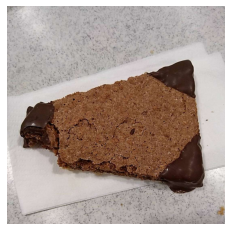

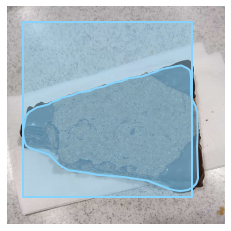

In [ ]:
# Another example
num = 55
render_img_from_num(train_coco, train_annotations_data, img_number=num, img_folder_path=TRAIN_IMAGE_DIRECTORY, render_ann=False, show_bbox=False)
render_img_from_num(train_coco, train_annotations_data, img_number=num, img_folder_path=TRAIN_IMAGE_DIRECTORY, render_ann=True, show_bbox=True)

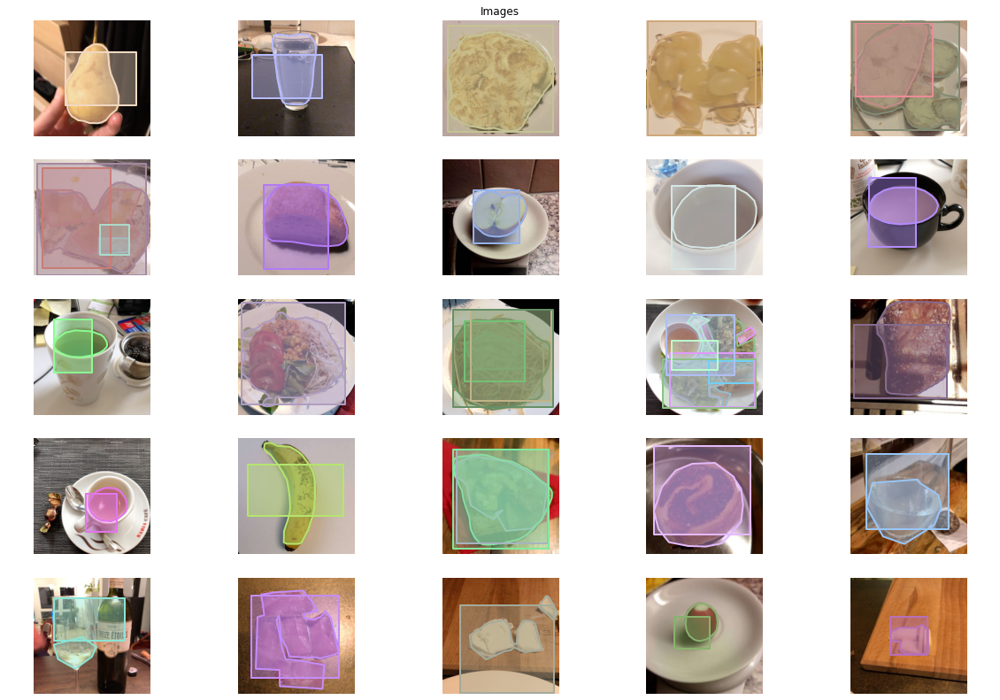

In [ ]:
# Funzione per mostrare una griglia con alcune immagini
def plot_grid_imgs(coco_data, img_info, img_folder_path, num_rows, num_cols):
    """
    Plot an image with or without bbox and mask
    :param coco_data: coco obj create with COCO fun
    :param annotations_data: annotations from annotation json file in coco format
    :param img_folder_path: path to img folder
    :param: num_rows (int): number of rows of the grid
    :param: num_cols (int): number of cols of the grid
    :return None
    """
    w, h = 12, 12  # Setting width and height of every image
    fig = plt.figure(figsize=(20, 14))  # Making the figure with size
    plt.title("Images")
    plt.axis('off')
    # Going thought every cell in rows and cols
    for i in range(1, num_cols * num_rows + 1):
        # get img info
        annIds = coco_data.getAnnIds(imgIds=img_info['id'][i])
        anns = coco_data.loadAnns(annIds)
        fig.add_subplot(num_rows, num_cols, i)
        # Show the image
        img = plt.imread(img_folder_path + img_info['file_name'][i])
        plt.imshow(img)
        # Render annotations on top of the image
        coco_data.showAnns(anns, draw_bbox=True)
        # Setting the axis off
        plt.axis("off")
    # Showing the figure
    plt.show()

plot_grid_imgs(train_coco, img_info_train, TRAIN_IMAGE_DIRECTORY, num_rows=5, num_cols=5)

Examine some annotations

Img num: 17713  - Img file name: 102403.jpg


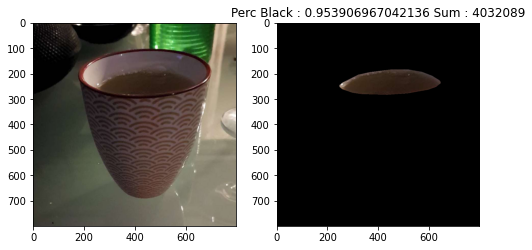

Img num: 16405  - Img file name: 100269.jpg


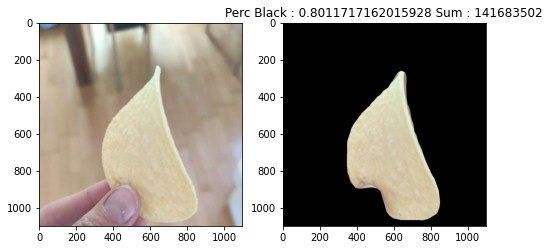

Img num: 1374  - Img file name: 070933.jpg


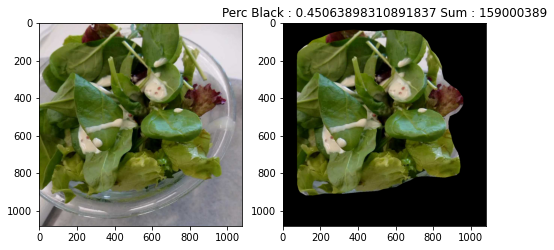

Img num: 13207  - Img file name: 028874.jpg


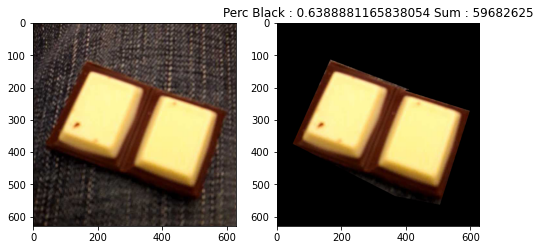

Img num: 9517  - Img file name: 086652.jpg


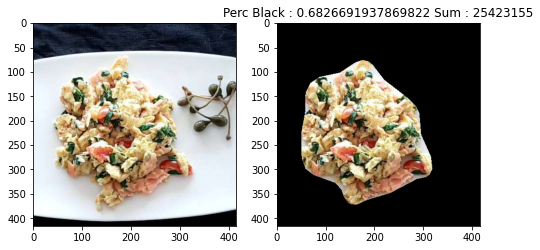

In [ ]:
def mask_image(path, sample, coco_data, img_id):
      """
      Given a file path, get the mask and apply it to the image
      """
      file_name = path.split("/")[-1]
      # get the annotations
      annIds = coco_data.getAnnIds(imgIds=[img_id])  # get annotations ids from image ids list
      anns = coco_data.loadAnns(annIds)  # get the entire annotations needed
      ann = random.choice(anns)
      # get the mask and bbox
      mask = coco_data.annToMask(ann)
      bbox = ann['bbox']
      # convert to numpy array
      masked = np.array(sample)
      # mask the image
      for i in range(masked.shape[2]):
        masked[:,:,i] *= mask
      # crop the image and convert it back to PIL
      try:
          cropped = masked[math.floor(bbox[1]):math.floor(bbox[1] + bbox[3]),math.floor(bbox[0]):math.floor(bbox[0]+bbox[2])]
      except:
          cropped = masked

      if np.mean(cropped == 0) == 1.0:
          pass
      elif np.mean(cropped == 0) > 0.95:
          sample = Image.fromarray(masked)
      else:
        sample = Image.fromarray(cropped)

      # return the masked and cropped image and the category id
      return sample

def show_img_with_separate_mask_max1(coco_data, annotations_data, img_folder_path):
  """
  this function show a random image and the first mask that is found.
  For this reason if an image has more than one obj only the first of them is shown in a separate img
  """
  img_number = random.randint(0, len(annotations_data['images']))
  my_img = annotations_data['images'][img_number]
  file_name = my_img['file_name']
  #print("Img num:", img_number, " - Img file name:", file_name)
  img_id = my_img['id']
  path = img_folder_path + file_name
  image = Image.open(path)
  sample = mask_image(path, image, coco_data, img_id)
  fig, ax = plt.subplots(1, 2, figsize=(8,6))
  ax[0].imshow(image)
  ax[1].imshow(sample)
  plt.title("Perc Black : " + str(np.mean(np.array(sample) == 0)) + " Sum : " + str(np.array(sample).sum()))
  plt.show()

num_of_img_to_show = 5
for x in range(0, num_of_img_to_show):
  show_img_with_separate_mask_max1(train_coco, train_annotations_data, TRAIN_IMAGE_DIRECTORY)

Img num: 16884  - Img file name: 035550.jpg


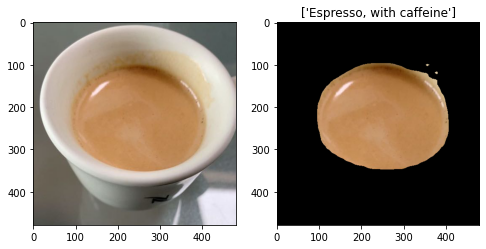

Img num: 8312  - Img file name: 084164.jpg


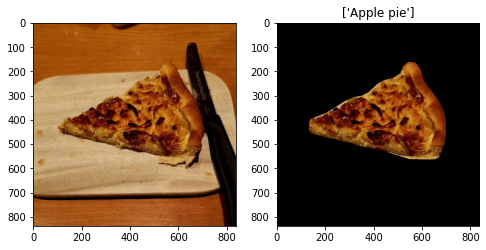

Img num: 14684  - Img file name: 097006.jpg


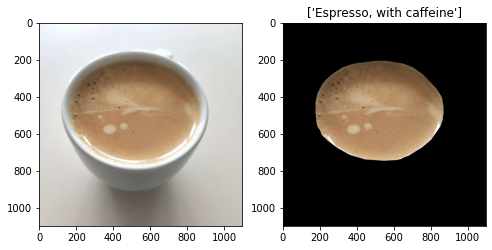

Img num: 383  - Img file name: 067883.jpg


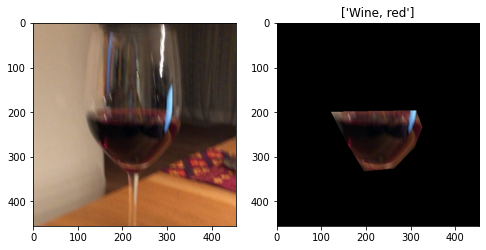

Img num: 19138  - Img file name: 039442.jpg


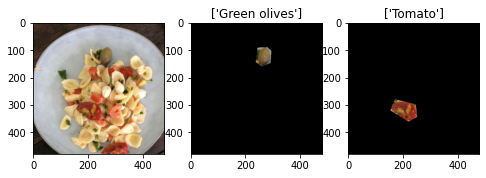

In [ ]:
def show_img_with_separate_mask(coco_data, annotations_data, img_folder_path):
      """
      Given a file path, get the mask and apply it to the image
      This function show all the masks for a ginve image in a separate figure. 
      For this reason if an img contains 3 different obj that 3 different figures will be shown.
      """
      img_number = random.randint(0, len(annotations_data['images']))
      my_img = annotations_data['images'][img_number]
      file_name = my_img['file_name']
      #print("Img num:", img_number, " - Img file name:", file_name)
      img_id = my_img['id']
      path = img_folder_path + file_name
      image = Image.open(path)
      
      # get the annotations
      annIds = coco_data.getAnnIds(imgIds=[img_id])  # get annotations ids from image ids list
      anns = coco_data.loadAnns(annIds)  # get the entire annotations needed
      #ann = random.choice(anns)
      # get the masks
      masks = []  # list of masks in the img
      class_ids = []  # list of class ids 
      for ann in anns:
        masks.append(coco_data.annToMask(ann))
        class_ids.append(ann['category_id'])

      # plot the results
      fig, ax = plt.subplots(nrows=1, ncols=(len(masks)+1), figsize=(8,6))
      ax[0].imshow(image)
      for i, mask in enumerate(masks):
        image_ = np.array(image)
        image_[:,:,0] *= mask
        image_[:,:,1] *= mask
        image_[:,:,2] *= mask
        ax[i+1].set_title(getClassNameReadable(coco_data, annotations_data, class_ids[i]))
        ax[i+1].imshow(image_)

      plt.show()

num_of_img_to_show = 5
for x in range(0, num_of_img_to_show):
  show_img_with_separate_mask(train_coco, train_annotations_data, TRAIN_IMAGE_DIRECTORY)

### Image visualization utils

Some funtion useful for visualize the annotaions from file and that will be used in the evaluation phase.

In [ ]:
def render_img_from_filename(coco_data, annotations_data, my_file, img_folder_path, render_ann, show_bbox):
    """
    Plot an image with or without bbox and mask
    """
    # get img info
    my_img = [ann for ann in annotations_data['images'] if ann["file_name"] == my_file]
    assert len(my_img) == 1
    my_img = my_img[0]
    # print("my img length ", len(my_img))
    # print(my_img)
    file_name = my_img['file_name']
    img_id = my_img['id']
    annIds = coco_data.getAnnIds(imgIds=[img_id])  # get annotations ids from image ids list
    anns = coco_data.loadAnns(annIds)  # get the entire annotations needed
    # load and render the image
    plt.imshow(plt.imread(img_folder_path + file_name))  # plot img
    plt.axis('off')
    color_list=['b', 'r', 'g', 'c', 'm', 'y', 'azure', 'darkorange', 'khaki', 'greenyellow', 'deeppink', 'slategray'] # max number of obj in a single img 12
    # Render annotations on top of the image
    if render_ann:
        coco_data.showAnns(anns, draw_bbox=show_bbox, dotted_bbox=True, color_list=color_list)
    
    # compute legend elements
    handles = []
    for i, ann in enumerate(anns):
      nm = getClassNameReadable(coco_data, annotations_data, ann["category_id"])
      ptc = patches.Patch(color=color_list[i], label=nm)
      handles.append(ptc)
    # set the legend
    plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(1.05, 1))
    plt.show()

In [ ]:
def show_img_with_separate_mask_from_filename(coco_data, annotations_data, my_file, img_folder_path):
      """
      Given a file path, get the mask and apply it to the image
      """
      my_img = [ann for ann in annotations_data['images'] if ann["file_name"] == my_file]
      assert len(my_img) == 1
      my_img = my_img[0]
      file_name = my_img['file_name']
      img_id = my_img['id']
      path = img_folder_path + file_name
      image = Image.open(path)
      
      # get the annotations
      annIds = coco_data.getAnnIds(imgIds=[img_id])  # get annotations ids from image ids list
      anns = coco_data.loadAnns(annIds)  # get the entire annotations needed
      #ann = random.choice(anns)
      # get the masks
      masks = []  # list of masks in the img
      class_ids = []  # list of class ids 
      for ann in anns:
        masks.append(coco_data.annToMask(ann))
        class_ids.append(ann['category_id'])

      # plot the results
      fig, ax = plt.subplots(nrows=1, ncols=(len(masks)+1), figsize=(8,6))
      ax[0].imshow(image)
      for i, mask in enumerate(masks):
        image_ = np.array(image)
        image_[:,:,0] *= mask
        image_[:,:,1] *= mask
        image_[:,:,2] *= mask
        ax[i+1].set_title(getClassNameReadable(coco_data, annotations_data, class_ids[i]))
        ax[i+1].imshow(image_)

      plt.show()

In [ ]:
#categories = {item['id'] : item['name'] for item in train_data['categories']}
def translate_bbox(bbox):
  """Translate a bbox into a matplotlib friendly format"""
  x = bbox[0]
  y = bbox[1]# - bbox[3]
  w = bbox[2]
  h = bbox[3]
  return x, y, w, h

def show_bbox_with_legend(coco_data, annotations_data, my_file, img_folder_path):
      """
      Given a file path, get the mask and apply it to the image
      """
      my_img = [ann for ann in annotations_data['images'] if ann["file_name"] == my_file]
      assert len(my_img) == 1
      my_img = my_img[0]
      file_name = my_img['file_name']
      img_id = my_img['id']
      path = img_folder_path + file_name
      image = Image.open(path)
      
      # get the annotations
      annIds = coco_data.getAnnIds(imgIds=[img_id])  # get annotations ids from image ids list
      anns = coco_data.loadAnns(annIds)  # get the entire annotations needed
      annsCats = [a["category_id"] for a in anns]

      # get the categories names 
      cat_names = [cat["name_readable"] for cat in category_info if cat["id"] in annsCats]

      # get the masks
      masks = []  # list of masks in the img
      class_ids = []  # list of class ids 
      for ann in anns:
        masks.append(coco_data.annToMask(ann))
        class_ids.append(ann['category_id'])

      image = Image.open(img_folder_path + my_file)

      fig,ax = plt.subplots(1)
      ax.imshow(image)
      colors = ['b', 'r', 'g', 'c', 'm', 'y', 'azure', 'darkorange', 'khaki', 'greenyellow', 'deeppink', 'slategray'] # max number of obj in a single img 12
      for j, item in enumerate(anns):
        x, y, w, h = translate_bbox(item['bbox'])
        rect = patches.Rectangle((x, y), w, h, 
                                 linewidth=1,
                                 edgecolor=colors[j],
                                 facecolor='none', 
                                 label=cat_names[j])
        ax.add_patch(rect)
      plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
      plt.show()

# **Fix Errors** 🔨

### Incorrect Annotations

Some of the images have annotations which are rotated, these problematic images cause copyMakeBorder error if not removed.
So, there are images that have a size mismatch between image size and the sizes recorded in train/val annotations.json

This problem was because some images were taken with a cellphone and the orientation was not taken into account, meaning that the width and height were swapped which caused an error (https://github.com/open-mmlab/mmdetection/issues/3482).

i.e : Lets say an image has a height of 400 and width of 200,
but it is recorded as height = 200 and width = 400. So we will have to accordingly fix these errors in the annotation file.

We will visualise these annotations below.

In [ ]:
# Function to check for problematic images
def check_problems_in_dataset(annotations_data, imgs_path):
  problematic_imgs = []
  problematic_imgs_numbers = []
  for num, i in enumerate(annotations_data['images']):
    file_path = imgs_path + i['file_name']
    im = cv2.imread(file_path)
    if((im.shape[0]!=i['height']) or (im.shape[1]!=i['width'])):
      print(i, im.shape)
      problematic_imgs.append(i)
      problematic_imgs_numbers.append(num)
    else:
      print(".",end="")
  print("\nProblematic images numbers:", problematic_imgs_numbers)
  return problematic_imgs, problematic_imgs_numbers

In [ ]:
# check training set
train_set_problematic_imgs, train_set_problematic_imgs_num = check_problems_in_dataset(train_annotations_data, TRAIN_IMAGE_DIRECTORY)

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [ ]:
# check training set
val_set_problematic_imgs, val_set_problematic_imgs_num = check_problems_in_dataset(val_annotations_data, VAL_IMAGE_DIRECTORY)

............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................{'id': 53879, 'file_name': '053879.jpg', 'width': 4608, 'height': 3456} (4608, 3456, 3)
....................................................................................................................................................................

In [ ]:
# Errors found
print("Number of problematic images in training set:", len(train_set_problematic_imgs))
print("Errors list:")
pprint(train_set_problematic_imgs)
print("\n--------------------------------------------------------------------------------------")
print("Number of problematic images in validation set:", len(val_set_problematic_imgs))
print("Errors list:")
pprint(val_set_problematic_imgs)

Number of problematic images in training set: 27
Errors list:
[{'file_name': '008618.jpg', 'height': 3024, 'id': 8618, 'width': 4032},
 {'file_name': '008619.jpg', 'height': 3024, 'id': 8619, 'width': 4032},
 {'file_name': '008621.jpg', 'height': 3024, 'id': 8621, 'width': 4032},
 {'file_name': '008620.jpg', 'height': 3024, 'id': 8620, 'width': 4032},
 {'file_name': '008626.jpg', 'height': 3024, 'id': 8626, 'width': 4032},
 {'file_name': '008628.jpg', 'height': 3024, 'id': 8628, 'width': 4032},
 {'file_name': '008627.jpg', 'height': 3024, 'id': 8627, 'width': 4032},
 {'file_name': '008817.jpg', 'height': 3024, 'id': 8817, 'width': 4032},
 {'file_name': '008864.jpg', 'height': 3024, 'id': 8864, 'width': 4032},
 {'file_name': '008869.jpg', 'height': 3024, 'id': 8869, 'width': 4032},
 {'file_name': '008919.jpg', 'height': 3024, 'id': 8919, 'width': 4032},
 {'file_name': '008934.jpg', 'height': 3024, 'id': 8934, 'width': 4032},
 {'file_name': '010655.jpg', 'height': 1960, 'id': 10655, 'wid

It turns out that the images with incorrect sizes also have rotated masks, let's look at the images with their annotations :

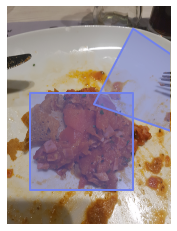

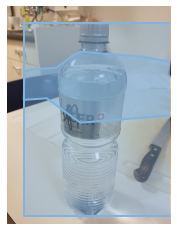

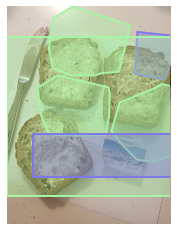

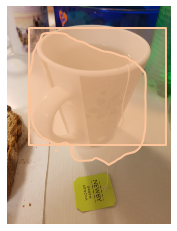

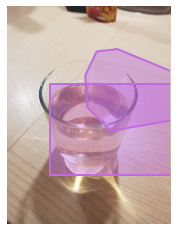

...

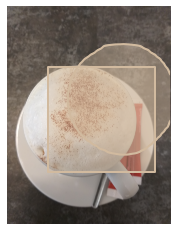

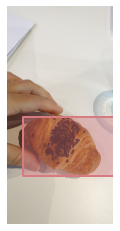

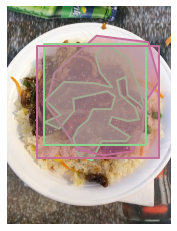

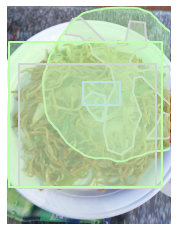

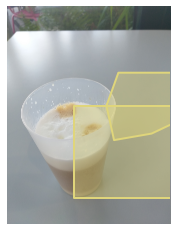

In [ ]:
# Show the images with the relative bad annotations
# source: https://colab.research.google.com/github/escuccim/food-recognition/blob/main/Images_with_Bad_Annotations.ipynb#scrollTo=3yawW7RtXV_0
def show_problematic_imgs(coco_data, problematic_img_list, img_folder_path, catIds):
  for item in problematic_img_list:
    # load and display the image
    img = coco_data.loadImgs(item['id'])[0]
    file_path = img_folder_path + item["file_name"]
    I = io.imread(file_path)
    # Load and display instance annotations
    plt.imshow(I)
    plt.axis('off')
    annIds = coco_data.getAnnIds(imgIds=img['id'])
    anns = coco_data.loadAnns(annIds)
    coco_data.showAnns(anns, draw_bbox=True)
    # show the result
    plt.show()

show_problematic_imgs(train_coco, train_set_problematic_imgs, TRAIN_IMAGE_DIRECTORY, category_info)

### **Fix incorrect annotations by adjusting images**

we can change img width and height to correct the images

In [ ]:
# Function for taking annotation & directiory of images, adjust width and height
# and returning new annoation json with fixed image size info
def fix_data(annotations, directiory):
  num_height_modifications = 0
  num_width_modification = 0
  for n, i in enumerate(tqdm((annotations['images']))):
      img = cv2.imread(directiory+i["file_name"])
      # check height
      if img.shape[0] != i['height']:
          annotations['images'][n]['height'] = img.shape[0]
          print(i["file_name"])
          print(annotations['images'][n], img.shape)
          num_height_modifications = num_height_modifications + 1
      # check width
      if img.shape[1] != i['width']:
          annotations['images'][n]['width'] = img.shape[1]
          print(i["file_name"])
          print(annotations['images'][n], img.shape)
          num_width_modification = num_width_modification + 1
  print("Number of height modifications:", num_width_modification)
  print("Number of width modifications:", num_width_modification)
  return annotations

In [ ]:
if do_imgs_fix_by_adjusting:
  #fix train annotations
  print("Fixing training data by removing incorrect imgs annotations......")
  train_annotations_data = fix_data(train_annotations_data, TRAIN_IMAGE_DIRECTORY)
  # save fixed training annotations on a file 
  with open(TRAIN_FIXED_ANNOTATIONS_PATH_ADJUST, 'w') as f:
    json.dump(train_annotations_data, f)
  print("END -> trainig data fixed.\n")

  #fix val annotations
  print("Fixing validation data by removing incorrect imgs annotations......")
  val_annotations_data = fix_data(val_annotations_data, VAL_IMAGE_DIRECTORY)
  # save fixed training annotations on a file 
  with open(VAL_FIXED_ANNOTATIONS_PATH_ADJUST, 'w') as f:
    json.dump(val_annotations_data, f)
  print("END -> validation data fixed.\n")

Fixing training data by removing incorrect imgs annotations......


008618.jpg
{'id': 8618, 'file_name': '008618.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008618.jpg
{'id': 8618, 'file_name': '008618.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008619.jpg
{'id': 8619, 'file_name': '008619.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008619.jpg
{'id': 8619, 'file_name': '008619.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008621.jpg
{'id': 8621, 'file_name': '008621.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008621.jpg
{'id': 8621, 'file_name': '008621.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008620.jpg
{'id': 8620, 'file_name': '008620.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008620.jpg
{'id': 8620, 'file_name': '008620.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008626.jpg
{'id': 8626, 'file_name': '008626.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008626.jpg
{'id': 8626, 'file_name': '008626.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008628.jpg
{'id': 86

053879.jpg
{'id': 53879, 'file_name': '053879.jpg', 'width': 4608, 'height': 4608} (4608, 3456, 3)
053879.jpg
{'id': 53879, 'file_name': '053879.jpg', 'width': 3456, 'height': 4608} (4608, 3456, 3)

Number of height modifications: 1
Number of width modifications: 1
END -> validation data fixed.



### **Fix incorrect annotations by removing incorrect images**

Remove incorrect images references from annotaions

In [ ]:
# inspired by Source -> https://colab.research.google.com/drive/1np03c9t4nLjB00IQ63AxAypXFcZbO11G?usp=sharing#scrollTo=SstjAZ9UR6mk
def remove_bad_img_and_ann(useless, useless_nums, annotation_data, correct_ann_file_path):
    """
    useless: contains the list of images with wrong annotations, the list obj are of the type
                {'id': 8619, 'file_name': '008619.jpg', 'width': 4032, 'height': 3024}
    annotations_data: is the obj with the annotations in Coco format read with json.read
    correct_ann_file_path: str that contains the new file, and the relative path, in which we are going to save the 
    new corrected annotation file
    """
    # extract ids from list of wrong obj
    bad_ids = [item["id"] for item in useless]
    print("Numebr of bad ids: ", len(bad_ids))
    print("Bad ids list:", bad_ids)
    num_img_removed = 0
    num_ann_removed = 0

    #count bad ids delete in the annotations data
    def count_annotations(annotation_data):
      # count bad element in images part of coco annotation
      count_bad_ids = 0
      for item in annotation_data['images']:
        if item["id"] in bad_ids:
            print("ITEM:", item)
            count_bad_ids = count_bad_ids + 1
      # count bad element in annotation part of coco annotation
      count_bad_ann = 0
      for item in annotation_data['annotations']:
        if item["image_id"] in bad_ids:
            count_bad_ann = count_bad_ann + 1
      print("Count bad ids = ", count_bad_ids)
      print("Count bad ann = ", count_bad_ann)

    print("Count bad elements in annotations BEFORE delete")
    count_annotations(annotation_data)

    # check if a id is in the list of bad ids
    def is_bad_id(bad_ids, item_id):
      if item_id in bad_ids:
        print("Found item id:", item_id)
        nonlocal img_bad_id_num
        img_bad_id_num = img_bad_id_num + 1
        return True
      else:
        return False

    # update image part
    img_bad_id_num = 0
    annotation_data['images'][:] = [item for item in annotation_data['images'] if not is_bad_id(bad_ids, item["id"])]
    print("bad img found and not included in the new list:", img_bad_id_num)
    num_img_removed = img_bad_id_num

    # update annotation part
    img_bad_id_num = 0
    annotation_data['annotations'][:] = [item for item in annotation_data['annotations'] if not is_bad_id(bad_ids, item["image_id"])]
    print("annotations relative to bad imgs found and not included in the new list:", img_bad_id_num)
    num_ann_removed = img_bad_id_num

    print("Count bad elements in annotations AFTER delete (This MUST be zero)")
    count_annotations(annotation_data)

    # count_bad_ids = 0
    # for i, item in enumerate(annotation_data['images']):
    #     if item["id"] in bad_ids:
    #         print("ITEM:", item)
    #         count_bad_ids = count_bad_ids + 1
    # print("NEW Count bad ids before delete = ", count_bad_ids)

    # # iterate and remove all the wron img from the Image part of Coco annotations
    # for i, item in enumerate(annotation_data['images']):
    #     if item["id"] in bad_ids:
    #         print("Deleting image annotation:", annotation_data["images"][i])
    #         num_img_removed = num_img_removed + 1
    #         del annotation_data["images"][i]

    # # iterate and remove all the annotarions relative to the wrong imgs from the Annotation part of Coco obj
    # for i, item in enumerate(annotation_data['annotations']):
    #     if item["id"] in bad_ids:
    #         print("Deleting annotation:", annotation_data["annotations"][i])
    #         num_ann_removed = num_ann_removed + 1
    #         del annotation_data["annotations"][i]

    # write the new corrected file without the wrong annotations
    with open(correct_ann_file_path, "w") as f:
        f.write(json.dumps(annotation_data))
    
    print("Num elements removed from 'image' in annotations data: ", num_img_removed)
    print("Num elements removed from 'annotation' in annotations data:", num_ann_removed)
    return annotation_data

In [ ]:
# remove wrong imgs from annotations
if not do_imgs_fix_by_adjusting:
  print("Fixing training data by removing incorrect imgs annotations......")
  train_annotations_data = remove_bad_img_and_ann(useless = train_set_problematic_imgs, 
                                                useless_nums = train_set_problematic_imgs_num,
                                                annotation_data=train_annotations_data, 
                                                correct_ann_file_path=TRAIN_FIXED_ANNOTATIONS_PATH_DEL)
  print("END -> trainig data fixed.\n")

  print("Fixing validation data by removing incorrect imgs annotations......")
  val_annotations_data = remove_bad_img_and_ann(useless = val_set_problematic_imgs, 
                                              useless_nums = val_set_problematic_imgs_num,
                                              annotation_data = val_annotations_data, 
                                              correct_ann_file_path = VAL_FIXED_ANNOTATIONS_PATH_DEL)
  print("END -> validation data fixed.\n")

### Check the results of fixing operation

`train_set_problematic_imgs_after_fix` must be empty!

In [ ]:
train_set_problematic_imgs_after_fix, _ = check_problems_in_dataset(train_annotations_data, TRAIN_IMAGE_DIRECTORY)
print("\nNo of problematic images: ", len(train_set_problematic_imgs_after_fix))

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [ ]:
print("Loading training data........................................................")
train_coco = COCO(train_fixed_annotation_path)
print("Loading validation data........................................................")
val_coco = COCO(val_fixed_annotation_path)

Loading training data........................................................
loading annotations into memory...
Done (t=3.21s)
creating index...
index created!
Loading validation data........................................................
loading annotations into memory...
Done (t=0.14s)
creating index...
index created!


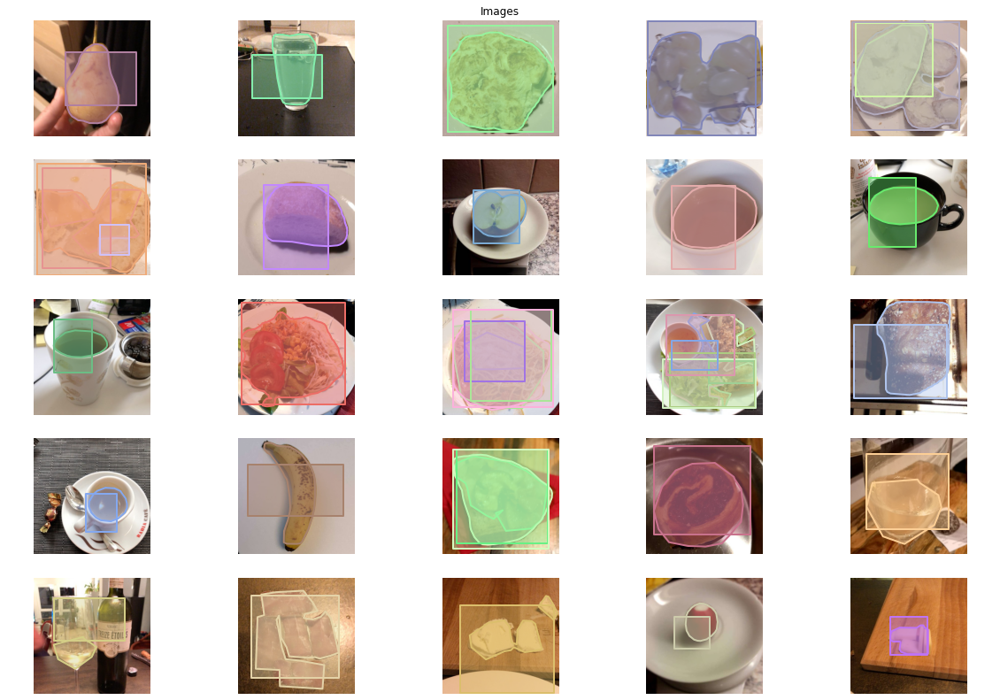

In [ ]:
# check the bbox 
plot_grid_imgs(train_coco, img_info_train, TRAIN_IMAGE_DIRECTORY, num_rows=5, num_cols=5)

### **Fix bbox**

While the masks seem to be correct, it seems that many of the images in the train dataset have bboxes that do not match the masks. While some of the bboxes are merely slightly off, many are drastically off, as we can see in the 
examples below.

If the bboxes are used in training, this may cause problems as the model will be attempting to learn using incorrect bboxes.

The following code recreates the bboxes based on the masks.

In [ ]:
def create_new_bboxes(item, coco_ds):
    try:
        # convert the item to a binary mask
        bin_mask = coco_ds.annToMask(item)

        # sum the rows and cols
        row_sums = bin_mask.sum(axis=1)
        col_sums = bin_mask.sum(axis=0)

        # find the first non-zero row
        for ty, row in enumerate(row_sums):
            if row > 0:
                break

        # find the first non-zero col
        for tx, col in enumerate(col_sums):
            if col > 0:
                break

        # find the first non-zero row from the end
        for by in range(len(row_sums) - 1, 0, -1):
            if row_sums[by] > 0:
                break

        # find the first non-zero col from the end
        for bx in range(len(col_sums) - 1, 0, -1):
            if col_sums[bx] > 0:
                break        

        item['bbox'] = [tx, ty, bx-tx, by-ty]
    except Exception as e:
        print("Error with image", item['image_id'])
        print(e)
    return item

def rebbox_dataset(coco_data, coco_annotations_data):
    """
    This function is used to adjust the bbox 
    inspired from Source -> https://discourse.aicrowd.com/t/incorrect-bboxes/4044
    :param coco_data: COCO class instance
    :param coco_annotations_data: numpy array obtained from the json annotation file
    """
    for i, item in enumerate(coco_annotations_data['annotations']):
        coco_annotations_data[i] = create_new_bboxes(item, coco_data)

    return coco_annotations_data

In [ ]:
if do_bbox_modification:
  # fix bbox in training set
  print("Fixing training set bbox...............")
  train_annotations_data = rebbox_dataset(coco_data=train_coco, coco_annotations_data=train_annotations_data)
  with open(TRAIN_FIXED_ANNOTATIONS_BBOX_PATH, 'w') as f:
    json.dump(train_annotations_data, f)
  print("END fixing training bbox.\n")

  # fix bbox in validation set
  print("Fixing validation set bbox...............")
  val_annotations_data = rebbox_dataset(coco_data=val_coco, coco_annotations_data=val_annotations_data)
  with open(VAL_FIXED_ANNOTATIONS_BBOX_PATH, 'w') as f:
    json.dump(val_annotations_data, f)
  print("END fixing validation bbox.\n")

Fixing training set bbox...............
END fixing training bbox.

Fixing validation set bbox...............
END fixing validation bbox.



Load the correct data and show examples of corrected bbox:

Load training data.....................................................
loading annotations into memory...
Done (t=5.86s)
creating index...
index created!
Load validation data........................................................
loading annotations into memory...
Done (t=0.16s)
creating index...
index created!


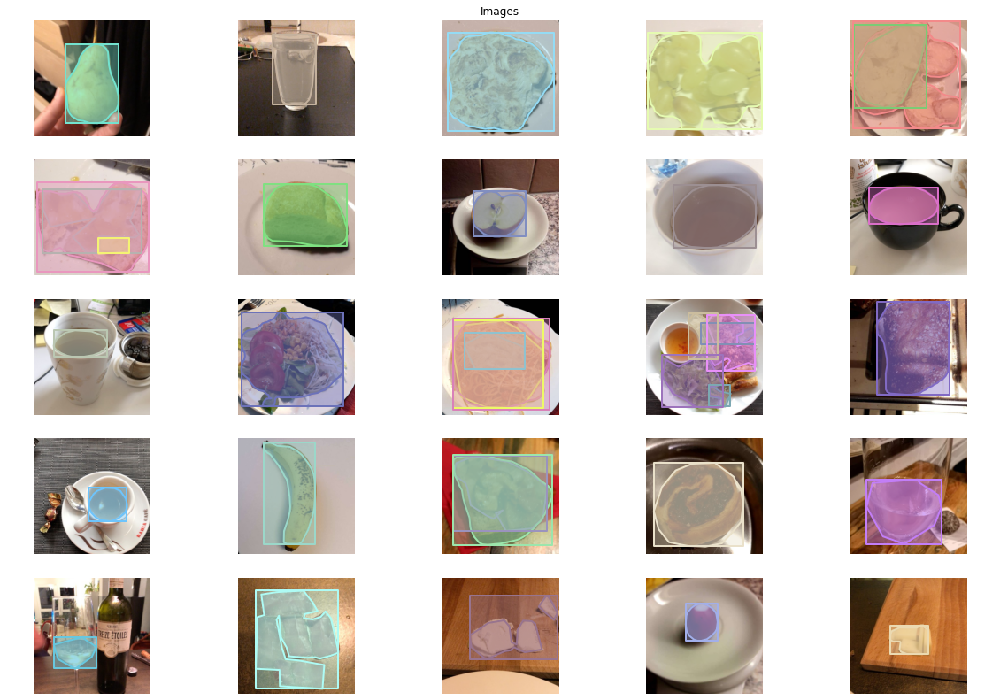

In [ ]:
# Load bbox data and plot some examples
if do_bbox_modification:
  # Reading the annotation files
  with open(TRAIN_FIXED_ANNOTATIONS_BBOX_PATH) as f:
    train_annotations_data = json.load(f)

  with open(VAL_FIXED_ANNOTATIONS_BBOX_PATH) as f:
    val_annotations_data = json.load(f)

  print("Load training data.....................................................")
  train_coco = COCO(TRAIN_FIXED_ANNOTATIONS_BBOX_PATH)
  print("Load validation data........................................................")
  val_coco = COCO(VAL_FIXED_ANNOTATIONS_BBOX_PATH)

  # Check if the images in the grid plot have correct bbox
  plot_grid_imgs(train_coco, img_info_train, TRAIN_IMAGE_DIRECTORY, num_rows=5, num_cols=5)

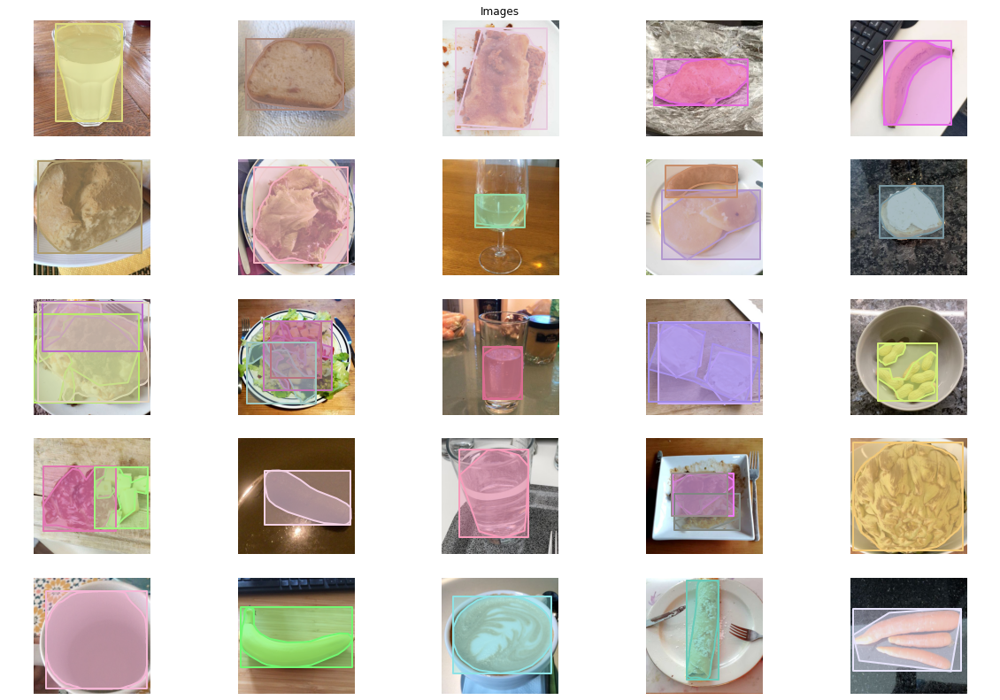

In [ ]:
# Check if the images in the grid plot have correct bbox
plot_grid_imgs(val_coco, img_info_val, VAL_IMAGE_DIRECTORY, num_rows=5, num_cols=5)

# **Train a detector on customized dataset using MMDetection**

To train a new detector, there are usually three things to do:
1. Support a new dataset, only if the dataset is not in a standard format (e.g COCO, PascalVOC,...)
2. Modify the config
3. Train a new detector

The first step is not needed in our case.


In [ ]:
# import needed libraries for detectors
import mmcv
from mmcv import Config
from mmcv.runner import load_checkpoint
import mmcv.visualization.image as mmcv_image

from mmdet.apis import set_random_seed
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector, inference_detector, init_detector, show_result_pyplot
from mmdet.models.detectors import BaseDetector

### Load data

This loading is needed only if the data exploration, visualization and preprocessing part was skipped

In [ ]:
if do_bbox_modification:
  train_final_file = TRAIN_FIXED_ANNOTATIONS_BBOX_PATH
  val_final_file = VAL_FIXED_ANNOTATIONS_BBOX_PATH
elif do_imgs_fix_by_adjusting:
  train_final_file = TRAIN_FIXED_ANNOTATIONS_PATH_ADJUST
  val_final_file = VAL_FIXED_ANNOTATIONS_PATH_ADJUST
else:
  train_final_file = TRAIN_FIXED_ANNOTATIONS_PATH_DEL
  val_final_file = VAL_FIXED_ANNOTATIONS_PATH_DEL

# Reading the annotation files
with open(train_final_file) as f:
  train_annotations_data = json.load(f)

with open(val_final_file) as f:
  val_annotations_data = json.load(f)

print("Load training data from " , train_final_file, " .....................................................")
train_coco = COCO(train_final_file)
print("Load validation data from " , val_final_file, " ........................................................")
val_coco = COCO(val_final_file)

Load training data from  ./data/train/fixed_annotations_bbox.json  .....................................................
loading annotations into memory...
Done (t=3.33s)
creating index...
index created!
Load validation data from  ./data/val/fixed_annotations_bbox.json  ........................................................
loading annotations into memory...
Done (t=0.15s)
creating index...
index created!


## Modify the configurations

The base config for the different models are available form the config folder of mmdetection

This is the convention used in mmdetection for config file names



```
{model}_[model setting]_{backbone}_{neck}_[norm setting]_[misc]_[gpu x batch_per_gpu]_{schedule}_{dataset}
```



* Backbone: usually a FCN network to extract feature maps, e.g. ResNet, MobileNet, etc.
* Neck: the component between backbones and head, e.g FPN, PAFPN
* Head: the component for specific tasks, e.g bbox prediction and mask prediction
* roi extractor: the part for extracting RoI features from feature maps, e.g. RoiAlign
* Schedule:  training schedule, options are 1x, 2x, 20e, etc. 1x and 2x means 12 epochs and 24 epochs respectively. 20e is adopted in cascade models, which denotes 20 epochs. For 20e, initial learning rate decays by a factor of 10 at the 16th and 19th epochs.
* Dataset: dataset type, e.g. COCO, VOC, ...

In [ ]:
# The models we want to test
MODELS_CONFIG = {
    'mask_rcnn_r50_fpn_1x': {
        'base_cfg_file': '/content/mmdetection/configs/mask_rcnn/mask_rcnn_r50_fpn_1x_coco.py',
        'name': 'mask_rcnn_r50',
        'updated_cfg_file': "/content/food-recognition/models/mask_rcnn_r50/mask_rcnn_r50.py",
        'epoch_filename': 'epoch_10.pth'
    }, 
    'cascade_rcnn_r50_fpn_1x': {
        'base_cfg_file': '/content/mmdetection/configs/cascade_rcnn/cascade_mask_rcnn_r50_fpn_1x_coco.py',
        'name': 'cascade_mask_rcnn_r50',
        'updated_cfg_file': "/content/food-recognition/models/cascade_mask_rcnn_r50/cascade_mask_rcnn_r50.py",
        'epoch_filename': 'epoch_10.pth'
    },
    'htc_r50_fpn_1x':{
        'base_cfg_file': '/content/mmdetection/configs/htc/htc_without_semantic_r50_fpn_1x_coco.py',
        'name': 'htc_r50',
        'updated_cfg_file': "/content/food-recognition/models/htc_r50/htc_without_semantic_r50.py",
        'epoch_filename': 'epoch_10.pth'
    },
    'htc_r50_fpn_1x_pretrained':{
        'base_cfg_file': '/content/mmdetection/configs/htc/htc_without_semantic_r50_fpn_1x_coco.py',
        'name': 'htc_r50_pretrained',
        'updated_cfg_file': "/content/food-recognition/models/htc_r50/htc_without_semantic_r50_pretrained.py",
        'epoch_filename': 'epoch_10.pth'
    },
    'htc_x101_fpn_64x4d':{
        'base_cfg_file': '/content/mmdetection/configs/htc/htc_x101_64x4d_fpn_16x1_20e_coco.py',
        'name': 'htc_x101',
        'updated_cfg_file': "/content/food-recognition/models/htc_x101/htc_x101.py",
        'epoch_filename': 'epoch_20.pth'
    },
}

There are 4 basic types under the config file:

* dataset
* model
* schedule
* default_runtime

For example, if some modification is made base on Faster R-CNN, user may first inherit the basic Faster R-CNN structure by specifying \_base\_ = ../faster\_rcnn/faster\_rcnn\_r50\_fpn\_1x\_coco.py, then modify the necessary fields in the config files.

In [ ]:
# Pick the model you want to use -> Select a model in `MODELS_CONFIG` dict.
#selected_model = 'mask_rcnn_r50_fpn_1x'
#selected_model = 'cascade_rcnn_r50_fpn_1x'  # ResNet 50
#selected_model = 'htc_r50_fpn_1x'
selected_model = 'htc_r50_fpn_1x_pretrained'
#selected_model = 'htc_x101_fpn_64x4d'

# Name of the config file.
base_cfg_file = MODELS_CONFIG[selected_model]['base_cfg_file']  # extract it from the dict
# Path to specific subfolders
base_path = "/content/drive/MyDrive/ML/models/"
working_directory = base_path+MODELS_CONFIG[selected_model]['name']+"/logs"
checkpoint_directory = base_path+MODELS_CONFIG[selected_model]['name']
test_directory = base_path+MODELS_CONFIG[selected_model]['name']+"/test_results"
prediction_directory =  base_path+MODELS_CONFIG[selected_model]['name']+"/prediction_imgs"
error_directory = base_path+MODELS_CONFIG[selected_model]['name']+"/error_analysis_results"
updated_cfg_file = MODELS_CONFIG[selected_model]['updated_cfg_file']
tensorboard_log_dir = working_directory+"/tf_logs"
epoch_filepath = checkpoint_directory+"/"+MODELS_CONFIG[selected_model]['epoch_filename']

print("Config file: ", base_cfg_file)

Config file:  /content/mmdetection/configs/htc/htc_without_semantic_r50_fpn_1x_coco.py


In [ ]:
# Modify the configuration using regular expression

# import re
# fname = config_fname
# with open(fname) as f:
#     s = f.read()
#     work_dir = re.findall(r"work_dir = \'(.*?)\'", s)[0]
#     # Update `num_classes` including `background` class.
#     s = re.sub('num_classes=.*?,',
#                'num_classes={},'.format(len(classes_names) + 1), s)
#     s = re.sub('total_epochs = \d+',
#                'total_epochs = {} '.format(total_epochs), s)
#     s = re.sub("data_root = 'data/coco/'",
#                 "data_root = 'data/'", s)
#     s = re.sub("annotations/instances_train2017.json",
#                 "train/annotations.json", s)
#     s = re.sub("annotations/instances_val2017.json",
#                 "val/annotations.json", s)
#     s = re.sub("annotations/instances_val2017.json",
#                 "val/annotations.json", s)
#     s = re.sub("train2017", "train/images", s)
#     s = re.sub("val2017", "val/images", s)
#     s = re.sub("workers_per_gpu=2","workers_per_gpu=0",s)
#     s = re.sub("imgs_per_gpu=2","imgs_per_gpu=4",s) 
#     s = re.sub("lr=0.02","lr=0.0025",s)  #need to change lr to 0.0025 since we are working with only 1 gpu

# with open(fname, 'w') as f:
#     f.write(s)

1. **Inherit base configs**: use inheritance to set the basic configurations of the model, the dataset and default runtime.

In [ ]:
# 1. INHERIT BASE CONFIG 

#cfg = Config.fromfile(os.path.join("/content/mmdetection/", base_cfg_file))
cfg = Config.fromfile(base_cfg_file) #/content/mmdetection/configs/mask_rcnn/mask_rcnn_r50_fpn_1x_coco.py

# Print default configuration
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CocoDataset'
data_root = 'data/coco/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='LoadAnnotations', with_bbox=True, with_mask=True, with_seg=True),
    dict(type='Resize', img_scale=(1333, 800), keep_ratio=True),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='SegRescale', scale_factor=0.125),
    dict(type='DefaultFormatBundle'),
    dict(
        type='Collect',
        keys=['img', 'gt_bboxes', 'gt_labels', 'gt_masks', 'gt_semantic_seg'])
]
test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1333, 800),
        flip=False,
        transforms=[
            dict(type='Resize', keep_r

2. **Modify the dataset**: mmdetection already supports Coco datase, but we need to change the numeber of classes in the model and also the classes name in the coco dataset.

In [ ]:
# 2. MODIFY DATASET CONFIG

# Modify dataset type and path
#cfg.dataset_type = 'CocoDataset'  # Dataset type, this will be used to define the dataset, use the CocoDataset type
cfg.data_root = './data/' # Root path of data

#cfg.data.train.type = 'CocoDataset'
cfg.data.train.data_root = './data/'
cfg.data.train.ann_file = 'train/' + final_annotation_filename
cfg.data.train.img_prefix = 'train/images/'

#cfg.data.val.type = 'CocoDataset'
cfg.data.val.data_root = './data/'
cfg.data.val.ann_file = 'val/' + final_annotation_filename
cfg.data.val.img_prefix = 'val/images/'

#cfg.data.test.type = 'CocoDataset'
cfg.data.test.data_root = './data/'
cfg.data.test.ann_file = 'val/' + final_annotation_filename
cfg.data.test.img_prefix = 'val/images/'  # same as validation

# modify the HEAD and set the correct num classes of the model in box head
# This is for mask_rcnn
if selected_model == 'mask_rcnn_r50_fpn_1x':
  cfg.model.roi_head.bbox_head.num_classes = no_categories #273
  cfg.model.roi_head.mask_head.num_classes = no_categories
elif selected_model == 'cascade_rcnn_r50_fpn_1x':
  # This is for cascade_maskrcnn ( there are 3 stages for bbox)
  cfg.model.roi_head.bbox_head[0].num_classes = no_categories
  cfg.model.roi_head.bbox_head[1].num_classes = no_categories
  cfg.model.roi_head.bbox_head[2].num_classes = no_categories
  cfg.model.roi_head.mask_head.num_classes = no_categories
else:
  cfg.model.roi_head.bbox_head[0].num_classes = no_categories
  cfg.model.roi_head.bbox_head[1].num_classes = no_categories
  cfg.model.roi_head.bbox_head[2].num_classes = no_categories
  cfg.model.roi_head.mask_head[0].num_classes = no_categories
  cfg.model.roi_head.mask_head[1].num_classes = no_categories
  cfg.model.roi_head.mask_head[2].num_classes = no_categories

  cfg.model.test_cfg.rcnn.max_per_img = 30
  cfg.model.roi_head.bbox_head[0].loss_cls.loss_weight = 2.0
  cfg.model.roi_head.bbox_head[1].loss_cls.loss_weight = 2.0
  cfg.model.roi_head.bbox_head[2].loss_cls.loss_weight = 2.0

# set the classes list
cfg.classes = category_names
cfg.data.train.classes = category_names
cfg.data.val.classes = category_names
cfg.data.test.classes = category_names

3. **Set generic params**: set needed cofigurations for directories, log, ...

In [ ]:
# 3. SET GENERIC PARAMS

# Set up working dir to save files and logs.
cfg.work_dir = working_directory

# Set up log config and enable tensorboard
cfg.log_config.interval = 20
cfg.log_config.hooks = [dict(type='TextLoggerHook')]
#cfg.log_config.hooks = [dict(type='TensorboardLoggerHook'), dict(type='TextLoggerHook')] # uncomment to add tensorboard logs

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

4. **Modify the training schedule**: The finetuning hyperparameters vary from the default schedule. It usually requires smaller learning rate and less training epochs

In [ ]:
# 4. MODIFY THE TRAINING SCHEDULE

# Total training epochs.
num_epochs = 10
cfg.total_epochs = num_epochs
cfg.runner = dict(type='EpochBasedRunner', max_epochs=num_epochs)

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
'''
Warm-up is a way to reduce the primacy effect of the early training examples.
The learning rate is increased linearly over the warm-up period. 
If the target learning rate is p and the warm-up period is n, 
 the first batch iteration uses 1*p/n for its learning rate; the second uses 2*p/n, and so on: 
 iteration i uses i*p/n, until we hit the nominal rate at iteration n.
This means that the first iteration gets only 1/n of the primacy effect.
'''
cfg.lr_config = dict(
    by_epoch=True,  # LR changes epoch by epoch
    policy='step',  # The policy of scheduler, also support CosineAnnealing, Cyclic, etc.
    warmup='linear',  # The warmup policy, also support `exp` and `constant`.
    warmup_iters=500,  # The number of iterations for warmup
    warmup_ratio=0.001,  # The ratio of the starting learning rate used for warmup
    gamma=0.1, # learning rate decay
    step=[16, 19]) # Steps to decay the learning rate

# Evaluation metric
cfg.evaluation.metric = ['bbox', 'segm']  # Options are 'bbox', 'segm', 'proposal', 'proposal_fast'.
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 20
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 1
cfg.checkpoint_config.by_epoch = True  # Saving checkpoints by epoch or by iteration.
cfg.checkpoint_config.save_optimizer = True  # It is usually used for resuming experiments.
#cfg.checkpoint_config.out_dir = "./mmdetection/checkpoints" # The directory to save checkpoints. If not specified, ``runner.work_dir`` will be used by default.
cfg.checkpoint_config.out_dir = checkpoint_directory
cfg.checkpoint_config.save_last = True

cfg.data.workers_per_gpu = 2 # workers per gpu default = 2. These are workers to pre-fetch data for each single GPU
cfg.data.samples_per_gpu = 4 # it's the batch size: Batch_size = samples_per_gpu * no_of_gpus. Default = 2

# load from checkpoint -> load pretrained weights
cfg.load_from = epoch_filepath
#cfl.load_from = None

# resume from checkpoint -> resume training from previous saving
#cfg.resume_from = epoch_filepath
#cfg.resume_from = None

5. Define **train** and **test data pipeline**: A pipeline consists of a sequence of operations. Each operation takes a dict as input and also output a dict for the next transform. The operations are categorized into data loading, pre-processing, formatting and test-time augmentation.

In [ ]:
# img_norm_cfg: It's determined by the pretrained model, and you can just keep it the same if you use the model from pytorch model zoo (REF: https://github.com/open-mmlab/mmdetection/issues/354)
img_norm_cfg = dict(mean=[123.675, 116.28, 103.53],  # Mean values used to pre-training the pre-trained backbone models
                    std=[58.395, 57.12, 57.375],  # Standard variance used to pre-training the pre-trained backbone models
                    to_rgb=True)

# Data augmetation using albumentations library
# ref: https://mmdetection.readthedocs.io/en/latest/_modules/mmdet/datasets/pipelines/transforms.html
# ref: https://albumentations.ai/docs/
albumentations_train_transforms = [
    dict(
        type='ShiftScaleRotate',  # Randomly apply affine transforms: translate, scale and rotate the input.
        shift_limit=0.0625,
        scale_limit=0.1,
        rotate_limit=20,
        p=0.9),  # probability of applying the transform (0.7)
    # dict(type='RandomRotate90',
    #     p=0.5),
    # dict(type='CLAHE',
    #     p=0.15),
    dict(
        type='RandomBrightnessContrast',  # Randomly change brightness and contrast of the input image
        brightness_limit=[0.1, 0.3],
        contrast_limit=[0.1, 0.3],
        p=0.5), # (0.3)
     dict(
        type="OneOf", # Select one of transforms to apply. Transforms probabilities will be normalized to one 1, so in this case transforms probabilities works as weights. Default probability is 0.5
        transforms=[
            dict(type="Blur", blur_limit=5),  # Blur the input image using a random-sized kernel
            dict(type="MotionBlur", blur_limit=5),
            dict(type="GaussNoise", var_limit=25),
            dict(type="ImageCompression", quality_lower=75),  # decrease jpeg with lower bound on the image quality
        ],
        p=0.6, #(0.5)
    ),
    #dict(type='JpegCompression', quality_lower=75, quality_upper=99, p=0.25),
    #dict(type="GaussNoise",p=0.2),
    #dict(type='ChannelShuffle', p=0.1), # (0.1)
    dict(type='MultiplicativeNoise', multiplier=[0.5, 1.5], per_channel=True, p=0.1)
]

# Definition of the training pipeline
train_pipeline = [
                  
  # A. DATA LOADING
    dict(type='LoadImageFromFile'),  # load images from file path
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),  # load annotations for current image

  # B. DATA PRE-PROCESSING
    dict(type='Resize',  # Augmentation pipeline that resize the images and their annotations
         img_scale=[(480, 480), (960, 960)],   # multiscale training -> resizing images to different scales at each iteration
         # ``ratio_range is None`` and ``multiscale_mode == "range"``: randomly sample a scale from the multiscale range.
         ratio_range=None,
         multiscale_mode='range',
         keep_ratio=True),  # keep the aspect ratio when resizing the image.
    dict(type='Albu',
         transforms=albumentations_train_transforms,  # A list of albu transformations
         bbox_params=dict(  # Parameters of bounding boxes for the albumentation `Compose`
             type='BboxParams',
             format='pascal_voc',
             label_fields=['gt_labels'],
             min_visibility=0.0,
             filter_lost_elements=True),
         keymap={  # Contains {'input key':'albumentation-style key'}
             'img': 'image',
             'gt_masks': 'masks',
             'gt_bboxes': 'bboxes'
         },
         update_pad_shape=False,
         skip_img_without_anno=False),
    dict(type='RandomFlip',  #  Augmentation pipeline that flip the images and their annotations
         # ``flip_ratio`` is float, ``direction`` is string: the image will be ``direction``ly flipped with probability of ``flip_ratio`` .
         flip_ratio=0.5,  # The ratio or probability to flip
         direction='horizontal'),  # valid directions ['horizontal', 'vertical', 'diagonal']
    dict(type='Normalize', **img_norm_cfg),  # Augmentation pipeline that normalize the input images
    dict(type='Pad', size_divisor=32),  # Pad config, with the number the padded images should be divisible

  # C. FORMATTING
    dict(type='DefaultFormatBundle'),  # It simplifies the pipeline of formatting common fields, including "img", "proposals", "gt_bboxes", "gt_labels", "gt_masks" and "gt_semantic_seg".Formatted using: transpose, to tensor, to DataContainer
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels', 'gt_masks'])  # Pipeline that decides which keys in the data should be passed to the detector
]

# Definition of the testing pipeline
test_pipeline = [
                 
  # A. DATA LOADING
    dict(type='LoadImageFromFile'), # load image from file

  # B. TEST TIME AUGMENTATION
    dict(
        type='MultiScaleFlipAug',
        img_scale=(800, 800),  # Decides the largest scale for testing, used for the Resize pipeline
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **img_norm_cfg),
            dict(type='Pad', size_divisor=32),
            dict(type='DefaultFormatBundle'),
            dict(type='Collect', keys=['img'])
        ])
]

# set the pipeline in the config
cfg.train_pipeline = train_pipeline
cfg.test_pipeline = test_pipeline
cfg.data.train.pipeline = train_pipeline
cfg.data.val.pipeline = test_pipeline
cfg.data.test.pipeline = test_pipeline

In [ ]:
# PRINT FINAL CONFIG FOR THE CURRENT MODEL
# We can have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CocoDataset'
data_root = './data/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(
        type='Resize',
        img_scale=[(480, 480), (960, 960)],
        ratio_range=None,
        multiscale_mode='range',
        keep_ratio=True),
    dict(
        type='Albu',
        transforms=[
            dict(
                type='ShiftScaleRotate',
                shift_limit=0.0625,
                scale_limit=0.1,
                rotate_limit=20,
                p=0.9),
            dict(
                type='RandomBrightnessContrast',
                brightness_limit=[0.1, 0.3],
                contrast_limit=[0.1, 0.3],
                p=0.5),
            dict(
                type='OneOf',
                transforms=[
                    dict(type='Blur', blur_limit=5),
             

## Train a new detector 

Finally, lets initialize the dataset and detector, then train a new detector!

### Build and train the model

In [ ]:
# garbage collection to clean the memory
import gc 
gc.collect()
torch.cuda.empty_cache()

# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(
    cfg.model, 
    train_cfg=cfg.get('train_cfg'), 
    test_cfg=cfg.get('test_cfg')
    )
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(os.path.abspath(cfg.work_dir))
train_detector(model,  
               datasets, 
               cfg, 
               distributed=False,  # run on the gpu or distribuited sistem
               validate=True)  # register eval hooks

/content/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:21: UserWarning:

mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"



loading annotations into memory...
Done (t=3.31s)
creating index...
index created!


/content/mmdetection/mmdet/models/backbones/resnet.py:400: UserWarning:


2021-05-17 07:00:46,480 - mmdet - INFO - load checkpoint from /content/drive/My Drive/ML/models/htc_r50_pretrained/epoch_8.pth
2021-05-17 07:00:46,491 - mmdet - INFO - Use load_from_local loader


loading annotations into memory...
Done (t=0.16s)
creating index...
index created!


2021-05-17 07:01:00,202 - mmdet - INFO - resumed epoch 8, iter 45999
2021-05-17 07:01:00,205 - mmdet - INFO - Start running, host: root@1a616a20d89e, work_dir: /content/drive/MyDrive/ML/models/htc_r50_pretrained/logs
2021-05-17 07:01:00,210 - mmdet - INFO - workflow: [('train', 1)], max: 20 epochs
2021-05-17 07:01:09,136 - mmdet - INFO - Saving checkpoint at 46000 iterations
2021-05-17 07:02:30,499 - mmdet - INFO - Epoch [9][20/6031]	lr: 2.500e-03, eta: 3 days, 19:15:42, time: 4.404, data_time: 0.162, memory: 7127, loss_rpn_cls: 0.0061, loss_rpn_bbox: 0.0053, s0.loss_cls: 0.2783, s0.acc: 96.5454, s0.loss_bbox: 0.0390, s0.loss_mask: 0.2393, s1.loss_cls: 0.1623, s1.acc: 95.6885, s1.loss_bbox: 0.0495, s1.loss_mask: 0.1141, s2.loss_cls: 0.0860, s2.acc: 95.4321, s2.loss_bbox: 0.0346, s2.loss_mask: 0.0543, loss: 1.0688
2021-05-17 07:03:50,150 - mmdet - INFO - Epoch [9][40/6031]	lr: 2.500e-03, eta: 3 days, 14:52:15, time: 3.982, data_time: 0.030, memory: 7127, loss_rpn_cls: 0.0084, loss_rpn_b

RuntimeError: ignored

Training on a single GPU can be done also using tools/train.py to launch training jobs on a single GPU. The basic usage is as follows:



In [ ]:
""" 
!python tools/train.py \ 
    ${CONFIG_FILE} \
    [optional arguments]          
    # --resume-from ${CHECKPOINT_FILE}: Resume from a previous checkpoint file.
    # --options 'Key=value': Overrides other settings in the used config.
    
    # NOTE
    # resume-from loads both the model weights and optimizer status, and the epoch is also inherited from the specified checkpoint. It is usually used for resuming the training process that is interrupted accidentally. load-from only loads the model weights and the training epoch starts from 0. It is usually used for finetuning.

    # other optional arguments are --show, --show-dir as explained for the testing
"""

# **Testing**

After finetuning the detector, let's visualize the prediction results!

In [ ]:
#lets get the latest checkpoint file or some other checkpoint we want
#checkpoint_file = os.path.join(work_dir, "latest.pth")
checkpoint_file = "./drive/MyDrive/ML/"+MODELS_CONFIG[selected_model]['name']+"/epoch_10.pth"  # checkpoint_directory + "latest.pth"
assert os.path.isfile(checkpoint_file), '`{}` not exist'.format(checkpoint_file)
checkpoint_file = os.path.abspath(checkpoint_file)
checkpoint_file

'/content/drive/MyDrive/ML/mask_rcnn_r50/epoch_10.pth'

In [ ]:
# fix for colab
def imshow(img, win_name='', wait_time=0): plt.figure(
    figsize=(50, 50)); plt.imshow(img)
mmcv_image.imshow = imshow

In [ ]:
# define a score threshold
score_thr = 0.3 # if some predictions are missing decrease the threshold

### Visualize results for an image

In [ ]:
# build the model from a config file and a checkpoint file
#model = init_detector(config, checkpoint, device='cuda:0') # initialize the detector
#model = init_detector(config_fname, checkpoint_file)
#cfg = Config.fromfile(os.path.join("/content/mmdetection/", base_cfg_file))
cfg_ = Config.fromfile("/content/food-recognition/models/mask_rcnn_r50/mask_rcnn_r50.py") #/content/mmdetection/configs/mask_rcnn/mask_rcnn_r50_fpn_1x_coco.py

model = init_detector(cfg_, checkpoint_file, device='cpu')

# test a single image and show the results
tested_file = "006505.jpg"
img_path = VAL_IMAGE_DIRECTORY + tested_file   #you can change this to any image you want!

result = inference_detector(model, img_path)
#print("RESULTS:")
#print(result)

Use load_from_local loader


1. Show only groud truth bbox

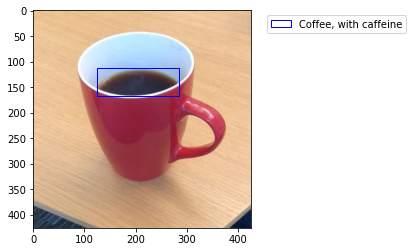

In [ ]:
show_bbox_with_legend(val_coco, val_annotations_data, tested_file, VAL_IMAGE_DIRECTORY)

2. Show ground truth bbox and mask

my img length  4
{'id': 6505, 'file_name': '006505.jpg', 'width': 426, 'height': 426}


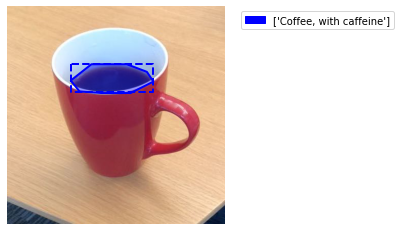

In [ ]:
render_img_from_filename(val_coco, val_annotations_data, my_file=tested_file, img_folder_path=VAL_IMAGE_DIRECTORY, render_ann=True, show_bbox=True)

3. Show original separated mask

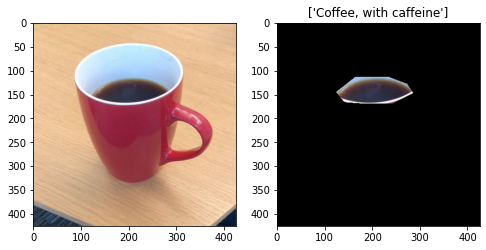

In [ ]:
show_img_with_separate_mask_from_filename(val_coco, val_annotations_data, tested_file, VAL_IMAGE_DIRECTORY)

4. Show result with score, using mmdetection built in function

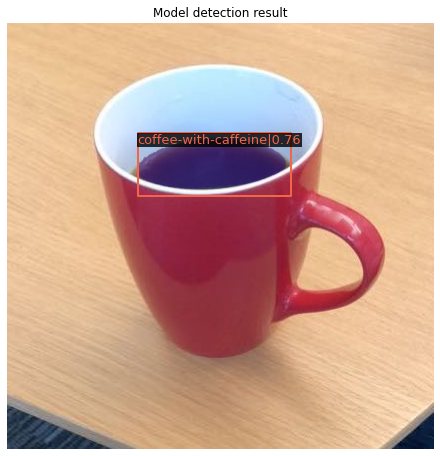

In [ ]:
show_result_pyplot(model, img_path, result, score_thr=0.3, title='Model detection result', wait_time=0)

### Test on all the data

We can use the low level inference modules provided with MMDetection to produce results from the trained model

In [ ]:
# Signgle gpu testing
#Lets check out the results on the entire val set
"""
CONFIG_FILE = configuration file
CHECKPOINT_FILE = checkpoint of the given model
[--out ${RESULT_FILE}] \ # Filename of the output results in pickle format. If not specified, the results will not be saved to a file.
[--eval ${EVAL_METRICS}] \ # Items to be evaluated on the results. Allowed values depend on the dataset, e.g., proposal_fast, proposal, bbox, segm are available for COCO. segm is used in coco as mAP
[--show] # If specified, detection results will be plotted on the images and shown in a new window. 
--show-dir: If specified, detection results will be plotted on the images and saved to the specified directory.
"""
res_path = "'"+test_directory + "/results.pkl" + "'"
test_res = "'"+test_directory + "/results" + "'"
checkpoint_path = checkpoint_directory + "/epoch_10.pth"
!python mmdetection/tools/test.py {updated_cfg_file} {checkpoint_path} --eval segm --out {res_path} --show --show-dir {test_res} 2>&1 | tee ap_log.txt
#generate JSON files (ref: https://mmdetection.readthedocs.io/en/latest/1_exist_data_model.html?highlight=test.py)
# This command generates two JSON files mask_rcnn_test-dev_results.bbox.json and mask_rcnn_test-dev_results.segm.json.
my_options = "jsonfile_prefix=" + test_directory + "/results"  # option for saving results in a json file (not pkl)
!python mmdetection/tools/test.py {updated_cfg_file} {checkpoint_path}  --format-only --options {my_options}

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
Use load_from_local loader
[                                                  ] 0/1269, elapsed: 0s, ETA:/content/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:21: UserWarning: mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"
  UserWarning)
[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1269/1269, 1.6 task/s, elapsed: 771s, ETA:     0s2021-05-17 18:07:39,048 - /content/drive/MyDrive/models/htc_r50_pretrained/test_results/eval_logger.txt - INFO - Evaluating segm...
/content/mmdetection/mmdet/datasets/coco.py:450: UserWarning: The key "bbox" is deleted for more accurate mask AP of small/medium/large instances since v2.12.0. This does not change the overall mAP calculation.
  UserWarning)
/usr/local/lib/python3.7/dist-packages/pycocotools/cocoeval.py:410: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by it

The predictions have been saved to results.bbox.json (for bbox results) and results.segm.json (for masks results). 

results.segm.json is created for the test set images and is what is needed to compute the performance measures. 

# **Evaluation**

Evaluate the results locally for the val set.

In [ ]:
# Function to save a list of elements on a file
def save_list_to_txt_file(out_path, mylist):
  with open(out_path, "w") as f:
    for item in mylist:
        f.write("%s\n" % item)

In [ ]:
IMAGES_DIR = VAL_IMAGE_DIRECTORY
GROUND_TRUTH_ANNOTATION_PATH = "./data/val/" + final_annotation_filename 
ground_truth_annotations = COCO(GROUND_TRUTH_ANNOTATION_PATH)
results_filepath = test_directory + "/results.segm.json"
submission_file = json.loads(open(results_filepath).read())
results = ground_truth_annotations.loadRes(submission_file)
#paths to save results
segm_path = test_directory+"/stats_segm_cocoeval.txt"
bbox_path = test_directory+"/stats_bbox_cocoeval.txt"

#Compute results
print("Evaluate segmentation:")
cocoEval = COCOeval(ground_truth_annotations, results, 'segm')
print("evaluate......")
cocoEval.evaluate()  # run per image evaluation
print("accumulate......")
cocoEval.accumulate()  # accumulate per image results
print("summarize.......")
cocoEval.summarize()  # display summary metrics of results
print("stats")
print(cocoEval.stats)
#save results
save_list_to_txt_file(segm_path, cocoEval.stats)

#average_precision = cocoEval.summarize._summarize(ap=1, iouThr=0.5, areaRng="all", maxDets=100)
#average_recall = cocoEval.summarize(ap=0, iouThr=0.5, areaRng="all", maxDets=100)
#print("Average Precision : {} || Average Recall : {}".format(average_precision, average_recall))

print("Evaluate bounding boxes:")
cocoEval = COCOeval(ground_truth_annotations, results, 'bbox')
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()
#save results
save_list_to_txt_file(bbox_path, cocoEval.stats)

loading annotations into memory...
Done (t=0.14s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.15s)
creating index...
index created!
Evaluate segmentation:
evaluate......
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=25.99s).
accumulate......
Accumulating evaluation results...
DONE (t=5.71s).
summarize.......
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.471
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.609
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.537
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.600
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.425
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.482
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.676
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.688


### **A.** Log analysis

In [ ]:
"""
python tools/analysis_tools/analyze_logs.py plot_curve 
[--keys ${KEYS}] 
[--title ${TITLE}] 
[--legend ${LEGEND}] 
[--backend ${BACKEND}] 
[--style ${STYLE}] 
[--out ${OUT_FILE}]
"""
# Examples of log analysis
loganalysis_filepath =  working_directory + "/epoch10.log.json"
print("Log file:", loganalysis_filepath)

#Plot the classification loss of some run.
loss_log_path = test_directory + "/loss.jpg"
!python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys loss --title "Loss Function Analysis" --legend loss --out {loss_log_path}

# MASK RCNN
if selected_model == 'mask_rcnn_r50_fpn_1x':
  !python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys acc --title "Accuracy Mask RCNN" --legend loss --out ./drive/MyDrive/ML/models/mask_rcnn_r50/test_results/acc.jpg
  !python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys loss_cls --title "Classification Loss Analysis" --legend loss --out ./drive/MyDrive/ML/models/mask_rcnn_r50/test_results/loss_cls.jpg
  !python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys loss_bbox --title "Bbox Loss Analysis" --legend loss --out ./drive/MyDrive/ML/models/mask_rcnn_r50/test_results/loss_bbox.jpg
  !python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys loss_mask --title "Mask Loss Analysis" --legend loss --out ./drive/MyDrive/ML/models/mask_rcnn_r50/test_results/loss_mask.jpg
else:
  # CASCADE RCNN && HTC
  acc_log_path = test_directory + "/stage_acc.jpg"
  print("Accuracy curve filepath:", acc_log_path)
  losscls_log_path = test_directory + "/loss_cls.jpg"
  lossbbox_log_path = test_directory + "/loss_bbox.jpg"
  lossmask_log_path = test_directory + "/loss_mask.jpg"
  !python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys s0.acc s1.acc s2.acc --title Accuracy --legend s0_accuracy s1_accuracy s2_accuracy --out {acc_log_path}
  !python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys s0.loss_cls s1.loss_cls s2.loss_cls --title ClassifiersLoss --legend s0_loss_cls s1_loss_cls s2_loss_cls --out {losscls_log_path}
  !python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys s0.loss_bbox s1.loss_bbox s2.loss_bbox --title BboxLoss --legend s0_loss_bbox s1_loss_bbox s2_loss_bbox --out {lossbbox_log_path}
  !python mmdetection/tools/analysis_tools/analyze_logs.py plot_curve {loganalysis_filepath} --keys s0.loss_mask s1.loss_mask s2.loss_mask --title MaskLoss --legend s0_loss_mask s1_loss_mask s2_loss_mask --out {lossmask_log_path}

#Compute the average training speed.
#print("check training speed")
#train_time_filepath = test_directory+MODELS_CONFIG[selected_model]["name"]+"_"+"train_time.txt"
#!python mmdetection/tools/analysis_tools/analyze_logs.py cal_train_time {loganalysis_filepath} [--include-outliers] 2>&1 | tee {train_time_filepath} 

Log file: /content/drive/MyDrive/ML/models/htc_r50/logs/epoch10.log.json
plot curve of /content/drive/MyDrive/ML/models/htc_r50/logs/epoch10.log.json, metric is loss
save curve to: /content/drive/MyDrive/ML/models/htc_r50/test_results/loss.jpg
Accuracy curve filepath: /content/drive/MyDrive/ML/models/htc_r50/test_results/stage_acc.jpg


### Setting up Tensorboard

Setting up Tensorboard to visualize the some nice graphs if the tensorboardHook has been used and tf_logs are available.

In [ ]:
# check if tensorflow was installed and the version must be > 2.0
!pip show tensorflow

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir {tensorboard_log_dir} # "./drive/My Drive/ML/experiments/tf_logs" #--host localhost --port 8088

### **B.** Results analysis



In [ ]:
"""
!python tools/analysis_tools/analyze_results.py \
      ${CONFIG} \  #The path of a model config file.
      ${PREDICTION_PATH} \  # Output result file in pickle format from tools/test.py
      ${SHOW_DIR} \  # Directory where painted GT and detection images will be saved
      --show \  # show painted images
      [--wait-time ${WAIT_TIME}] \  # The interval of show (s), 0 is block
      [--topk ${TOPK}] \  # The number of saved images that have the highest and lowest topk scores after sorting. If not specified, it will be set to 20
      [--show-score-thr ${SHOW_SCORE_THR}] \  #  Show score threshold. If not specified, it will be set to 0.
      [--cfg-options ${CFG_OPTIONS}]
"""

pkl_filepath = test_directory + "/results.pkl"
!python mmdetection/tools/analysis_tools/analyze_results.py {updated_cfg_file} {pkl_filepath} {prediction_directory} --show 

/content/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:21: UserWarning: mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"
  UserWarning)
loading annotations into memory...
Done (t=0.14s)
creating index...
index created!
[>>] 1269/1269, 0.3 task/s, elapsed: 3698s, ETA:     0s<Figure size 1010.01x1010.01 with 1 Axes>
<Figure size 401.01x400.01 with 1 Axes>
<Figure size 943.01x943.01 with 1 Axes>
<Figure size 794.01x793.01 with 1 Axes>
<Figure size 455.01x455.01 with 1 Axes>
<Figure size 831.01x830.01 with 1 Axes>
<Figure size 464.01x464.01 with 1 Axes>
<Figure size 426.01x426.01 with 1 Axes>
<Figure size 482.01x482.01 with 1 Axes>
<Figure size 480.01x480.01 with 1 Axes>
<Figure size 943.01x943.01 with 1 Axes>
<Figure size 455.01x455.01 with 1 Axes>
<Figure size 455.01x455.01 with 1 Axes>
<Figure size 831.01x830.01 with 1 Axes>
<Figure size 831.01x830.01 with 1 Axes>
<Figure size 480.01x480.01 with 1 Axes>
<Figure size 480.01x480.01 with 1

### **C.** Browse all the dataset with a given model

bworse dataset output all the images with the relative mask in a single folder

In [ ]:
# # Inspect dataset using mmdetection utils tools - https://github.com/open-mmlab/mmdetection/blob/master/docs/useful_tools.md
# # bworse dataset output all the images with the relative mask in a single folder

# !python mmdetection/tools/misc/browse_dataset.py {updated_cfg_file} --output-dir {prediction_directory}

# # !python tools/browse_dataset.py /content/mmdetection/configs/detectors/detectors_cascade_rcnn_r50_1x_coco.py \
# # --output-dir /content/fig \
# # --not-show

# !python tools/misc/browse_dataset.py \
#       ${CONFIG} \
#       [-h] \
#       [--skip-type ${SKIP_TYPE[SKIP_TYPE...]}] \
#       [--output-dir ${OUTPUT_DIR}] \
#       [--not-show] \
#       [--show-interval ${SHOW_INTERVAL}]

### **D.** Error analysis

In [ ]:
# NOTE: This type of error analysis consumes too much RAM!!!!!!
"""
!python tools/analysis_tools/coco_error_analysis.py \
      ${RESULT} \  #  results.bbox.json or results.segm.json, result file (json format) path
      ${OUT_DIR} \  # dir to save analyze result images
      [-h] \
      [--ann ${ANN}] \  # annotation file path
      [--types ${TYPES[TYPES...]}]  # result types
"""

# bbox_res_filepath = test_directory + "/results.bbox.json"
# bbox_error_dir = error_direcory + "/bbox_analysis"
# segm_res_filepath = test_directory + "/results.segm.json"
# segm_error_dir = error_direcory + "/segm_analysis"
# val_final_annotations_filepath = "./data/val/" + final_annotation_filename

# # Get COCO bbox error results per category, save analyze result images to the directory error_directory
# !python tools/analysis_tools/coco_error_analysis.py {bbox_res_filepath} {bbox_error_dir} --ann={val_final_annotations_filepath}

# # Get COCO segmentation error results per category, save analyze result images to the directory error_directory
# !python tools/analysis_tools/coco_error_analysis.py {segm_res_filepath} {segm_error_dir} --ann={val_final_annotations_filepath} --types='segm'

Error analysis using Tide, that is a general toolbox to compute and evaluate the effect of object detection and instance segmentation. 

In [ ]:
# Function to save a dict on a pkl file
def save_on_pkl_file(file_path, mydict):
  a_file = open(file_path, "wb")
  pickle.dump(mydict, a_file)
  a_file.close()

-- results.bbox --

bbox AP @ [50-95]: 48.81
                                         bbox AP @ [50-95]
  Thresh       50       55       60       65       70       75       80       85       90       95  
---------------------------------------------------------------------------------------------------
    AP      59.86    59.25    58.90    58.30    57.30    55.91    52.74    45.40    30.13    10.36  

                         Main Errors
  Type      Cls      Loc     Both     Dupe      Bkg     Miss  
-------------------------------------------------------------
   dAP    15.80     0.72     1.36     0.00     0.96     0.57  

                                                 Main Per Class Errors
                                                    class   Type      Cls      Loc     Both     Dupe      Bkg     Miss  
-----------------------------------------------------------------------------------------------------------------------
                beetroot-steamed-without-addition-of-sa

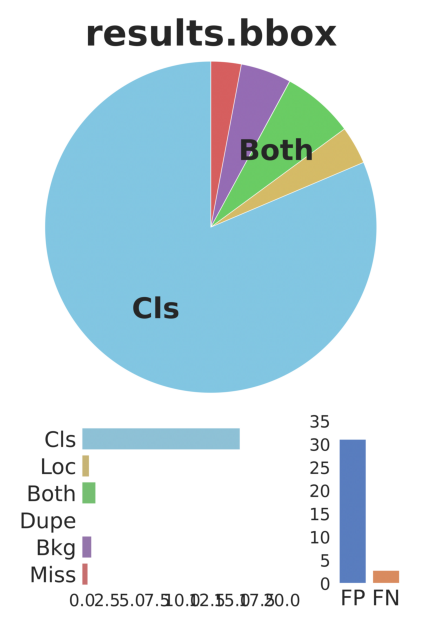

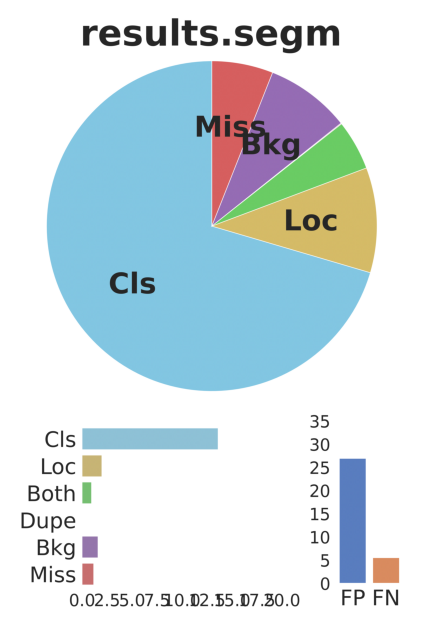

{'main': {'results.bbox': {'Bkg': 0.9574001571624038,
                           'Both': 1.3614749512003073,
                           'Cls': 15.804081417122227,
                           'Dupe': 0.002815298191904958,
                           'Loc': 0.7196908877294277,
                           'Miss': 0.5733984847344047},
          'results.segm': {'Bkg': 1.6019881410739671,
                           'Both': 0.9475045636223527,
                           'Cls': 13.612234304133949,
                           'Dupe': 0.01581680076685643,
                           'Loc': 1.9864380088973306,
                           'Miss': 1.1587736666348931}},
 'special': {'results.bbox': {'FalseNeg': 2.7523357039549197,
                              'FalsePos': 31.054728871717366},
             'results.segm': {'FalseNeg': 5.526638322669058,
                              'FalsePos': 26.927013114835987}}}


In [ ]:
tide = TIDE()

# Load the dataset
gt = datasets.COCO(val_final_file)

# Load the results in COCO format
bbox_file = test_directory + "/results.bbox.json"
mask_file = test_directory + "/results.segm.json"
bbox_results = datasets.COCOResult(bbox_file) # These files were downloaded above.
mask_results = datasets.COCOResult(mask_file) # Replace them with your own in practice.

# Run the evaluations on the standard COCO metrics (i.e., a range of AP with IoU thresholds [50:95])
tide.evaluate_range(gt, bbox_results, mode=TIDE.BOX ) # Several options are available here, see the functions
tide.evaluate_range(gt, mask_results, mode=TIDE.MASK) # evaluate and evaluate_range for more details.

# Summarize the evaluations run so far in the console
tide.summarize()  # Summarize the results as tables in the console

# Plot summaries for the evaluations run so far
tide.plot()       # Show a summary figure. Specify a folder and it'll output a png to that folder.

errors_dict = tide.get_all_errors()
pprint(errors_dict)

# save dict to file 
tide_err_filepath = base_path+MODELS_CONFIG[selected_model]['name']+"/error_analysis_results/tide_error_analysis.pkl"
save_on_pkl_file(tide_err_filepath, errors_dict)

In [ ]:
# Confusion matrices
confusion_matrices_obj = tide.get_confusion_matrix(val_annotations_data)
cm_bbox = confusion_matrices_obj['results.bbox']
cm_segm = confusion_matrices_obj['results.segm']
cm_bbox_df = pd.DataFrame(cm_bbox, columns=[i['name_readable'] for i in val_annotations_data['categories']], index=[i['name_readable'] for i in val_annotations_data['categories']])
cm_segm_df = pd.DataFrame(cm_segm, columns=[i['name_readable'] for i in val_annotations_data['categories']], index=[i['name_readable'] for i in val_annotations_data['categories']])

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def plot_confusion_matrix(cm_df):
  fig, ax = plt.subplots(figsize=(100,100))
  sns.heatmap(cm_df, annot=False, ax=ax)

In [ ]:
# example of confusion matrix
cm_bbox_df

,Water,Pear,Egg,Grapes,Butter,"Bread, white",Jam,"Bread, whole wheat",Apple,"Tea, green","White coffee, with caffeine","Tea, black",Mixed salad (chopped without sauce),Cheese,Tomato sauce,"Pasta, spaghetti",Carrot,Onion,"Beef, cut into stripes (only meat)",Rice noodles/vermicelli,"Salad, leaf / salad, green","Bread, grain","Espresso, with caffeine",Banana,Mixed vegetables,"Bread, wholemeal",Savoury puff pastry,"Wine, white",Dried meat,Fresh cheese,Red radish,Hard cheese,"Ham, raw","Bread, fruit",Oil & vinegar salad dressing,Tomato,Cauliflower,Potato-gnocchi,"Wine, red","Sauce, cream",...,Fruit coulis,Water with lemon juice,Brownie,Lemon,Veal sausage,Dates,Roll with pieces of chocolate,"TaboulÃ©, prepared, with couscous",Croissant with chocolate filling,Eggplant,Sesame seeds,Cottage cheese,Fruit tart,Cream cheese,"Tea, verveine",Tiramisu,"Grits, polenta, maize flour","Pasta, noodles",Artichoke,Blueberries,Mixed seeds,Caprese salad (Tomato Mozzarella),"Omelette, plain",Hazelnut,Kiwi,Dried raisins,Kolhrabi,Plums,"Beetroot, raw",Cream,Fajita (bread only),Apricots,Kefir drink,Bread,Strawberries,"Wine, rosÃ©","Watermelon, fresh",Green asparagus,White asparagus,Peach
Water,0,0,6,1,9,43,1,4,0,4,14,3,6,1,0,5,1,0,0,0,20,2,10,4,0,14,0,15,3,0,0,0,5,1,0,14,0,0,22,0,...,0,1,0,0,0,0,1,0,2,0,0,0,0,0,2,0,0,0,0,6,0,2,0,0,1,0,0,0,0,0,0,0,2,2,4,4,1,4,0,0
Pear,0,0,10,1,2,28,1,1,38,0,1,0,0,7,0,0,0,3,0,0,0,0,2,26,0,5,0,13,4,0,1,6,0,1,0,0,0,4,14,1,...,0,1,0,1,0,2,2,0,0,0,0,0,0,1,0,0,1,0,3,1,0,0,0,0,7,0,2,4,1,0,1,3,1,2,0,2,5,2,0,1
Egg,3,4,0,1,7,32,6,2,35,1,12,2,15,3,2,2,3,6,1,0,35,1,16,14,10,10,0,14,0,0,6,1,0,2,0,20,3,1,21,1,...,0,0,0,1,0,0,2,1,1,2,1,0,0,1,0,0,1,0,2,3,0,4,0,0,2,0,0,3,1,0,2,3,0,1,0,0,0,0,0,1
Grapes,10,0,1,0,0,0,0,0,30,3,0,0,1,0,0,0,0,3,0,0,0,0,0,1,0,0,0,5,2,0,3,0,0,0,0,6,0,4,21,0,...,1,1,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,1,6,0,0,0,1,5,1,0,4,0,0,0,2,2,0,3,2,0,0,0,1
Butter,71,1,7,0,0,41,15,3,10,1,6,0,0,13,2,4,2,1,0,0,3,2,14,24,1,24,0,15,1,2,0,13,2,0,0,1,2,1,9,0,...,0,1,0,0,1,1,0,0,0,1,0,0,0,1,0,0,1,0,1,6,0,0,0,0,2,1,0,1,0,0,0,0,2,3,5,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Wine, rosÃ©",75,4,0,0,1,2,1,1,25,3,0,0,1,0,0,0,0,1,0,0,3,0,13,23,0,0,0,14,1,0,0,0,1,0,0,1,0,0,22,0,...,0,0,0,0,0,2,1,0,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
"Watermelon, fresh",16,2,1,0,0,11,1,0,31,3,3,2,5,1,0,0,5,1,0,0,15,0,0,0,1,5,0,2,7,0,2,2,3,1,0,15,0,1,0,0,...,1,1,0,0,0,0,1,0,0,1,0,0,0,0,2,0,0,0,2,0,0,1,0,0,0,0,1,2,0,0,1,1,2,2,10,0,0,3,0,0
Green asparagus,43,3,0,0,0,0,0,0,0,3,0,0,12,3,0,1,0,1,0,1,25,0,0,22,10,3,0,14,5,0,0,0,1,0,0,5,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,3,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,6,0,0,0
White asparagus,0,6,2,0,0,2,0,0,32,0,0,0,1,6,0,0,0,0,0,1,4,0,0,21,3,1,0,1,1,0,0,6,0,0,0,0,0,1,7,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,3,0,0,0,1,0,1,0,0,0,6,3,0,0


In [ ]:
# show bbox confusion matrix using seaborn
# Rows represent the predictions, columns the gound truth labels
plot_confusion_matrix(cm_bbox_df)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# show segm confusion matrix using seaborn
# Rows represent the predictions, columns the gound truth labels
plot_confusion_matrix(cm_segm_df)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def extract_item_from_cm(df, row, col):
  """
  row is equal to the PREDICTED class
  col is equal to the GROUND TRUTH
  """
  result = df.loc[row, col]
  print("Pred:", row, "\t | \t GT:", col, "\t | \t res:", result)
  return result

In [ ]:
# show the number of error for a couple prediction / GT
extract_item_from_cm(cm_segm_df, 'Wine, white', 'Water')

Pred: Wine, white 	 | 	 GT: Water 	 | 	 res: 91


91

In [ ]:
def get_top_errors_per_item(df, n):
  df = df.transpose()
  nlargest = n
  order = np.argsort(-df.values, axis=1)[:, :nlargest]
  result = pd.DataFrame(df.columns[order], 
                      columns=['top{}'.format(i) for i in range(1, nlargest+1)],
                      index=df.index)
  print(result)
  return result

In [ ]:
# Extract the 5 classes with most errors (False negatives)
err_df = get_top_errors_per_item(cm_segm_df, 5)

                                 top1  ...                      top5
Water                  Water, mineral  ...               Wine, white
Pear                           Banana  ...                  Biscuits
Egg                        Mozzarella  ...  Egg, scrambled, prepared
Grapes                       Cucumber  ...                    Tomato
Butter                          Honey  ...                       Jam
...                               ...  ...                       ...
Wine, rosÃ©                     Water  ...                   Ketchup
Watermelon, fresh      Salmon, smoked  ...               Ham, cooked
Green asparagus          French beans  ...                  Cucumber
White asparagus                 Water  ...         Curry, vegetarian
Peach              Braided white loaf  ...                   Praline

[273 rows x 5 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



In [ ]:
err_df

,top1,top2,top3,top4,top5
Water,"Water, mineral","Syrup (diluted, ready to drink)",Boisson au glucose 50g,Water with lemon juice,"Wine, white"
Pear,Banana,Apple,Cheese for raclette,Lemon,Biscuits
Egg,Mozzarella,Sour cream,Onion,Mayonnaise,"Egg, scrambled, prepared"
Grapes,Cucumber,"Yaourt, yahourt, yogourt ou yoghourt, natural",Milk,Oil & vinegar salad dressing,Tomato
Butter,Honey,Cheese,Fresh cheese,Soft cheese,Jam
...,...,...,...,...,...
"Wine, rosÃ©",Water,"Wine, white",Ice tea,Orange,Ketchup
"Watermelon, fresh","Salmon, smoked","Ham, raw",Sugar Melon,Dried meat,"Ham, cooked"
Green asparagus,French beans,Leaf spinach,"Salad, rocket",Pasta,Cucumber
White asparagus,Water,"Bacon, cooking",Pomegranate,"Hamburger (Bread, meat, ketchup)","Curry, vegetarian"


In [ ]:
# the classes with most errors
err_df.loc[['Water', 'Butter', 'Bread, white', 'Banana', 'Salad, leaf / salad, green', 'Tomato', 'Coffee, with caffeine','Tea']]

,top1,top2,top3,top4,top5
Water,"Water, mineral","Syrup (diluted, ready to drink)",Boisson au glucose 50g,Water with lemon juice,"Wine, white"
Butter,Honey,Cheese,Fresh cheese,Soft cheese,Jam
"Bread, white","Bread, French (white flour)","Bread, half white",Braided white loaf,Bread,"Bread, sourdough"
Banana,Almonds,Pear,Apple,Biscuits,Kiwi
"Salad, leaf / salad, green",Mixed salad (chopped without sauce),Salad dressing,Balsamic salad dressing,French salad dressing,"Salad, rocket"
Tomato,Sweet pepper,Carrot,Caprese salad (Tomato Mozzarella),Strawberries,Red radish
"Coffee, with caffeine","Espresso, with caffeine","Ristretto, with caffeine","White coffee, with caffeine","Tea, green","Sauce, soya"
Tea,"Coffee, with caffeine","Tea, black","Tea, green",Herbal tea,"Tea, peppermint"


### **E.** Visualize predictions using DetVisGUI 

DetVisGUI is a lightweight GUI for visualizing the mmdetection results. It could display detection results with different threshold dynamically, and would be convenient for verifying detection results and groundtruth.

In [ ]:
# Clone the repository
git clone -b mmdetection https://github.com/Chien-Hung/DetVisGUI.git

In [ ]:
!apt-get install -y xvfb # Install X Virtual Frame Buffer
import os
os.system('Xvfb :1 -screen 0 1600x1200x16  &')    # create virtual display with size 1600x1200 and 16 bit color. Color can be changed to 24 or 8
os.environ['DISPLAY']=':1.0'    # tell X clients to use our virtual DISPLAY :1.0

**The GUI does not work in colab!**

In [ ]:
# THIS IS FOR DISPLAYIGN THE GUI
'''
python DetVisGUI_test.py \
      ${CONFIG_FILE} \ # Config file of mmdetction.
      ${CHECKPOINT_FILE} \  # Trained model checkpoint.
      ${TEST_IMAGES_FOLDER} \  # Test images folder path.
      [--device ${DEVICE}]  # cpu or cuda, default is cuda.
'''

# example
checkpoint_filepath = checkpoint_directory + "latest.pth"
!python DetVisGUI_test.py {updated_cfg_file} {checkpoint_filepath} {VAL_IMAGE_DIRECTORY}

### **F.** Model complexity

This shows the architecture of the net and the number of parameters

In [ ]:
'''
python tools/analysis_tools/get_flops.py ${CONFIG_FILE} [--shape ${INPUT_SHAPE}]
'''
model_complexity_filepath = test_directory+"/"+MODELS_CONFIG[selected_model]["name"]+"_"+"model_comlpexity.txt"
!python mmdetection/tools/analysis_tools/get_flops.py {updated_cfg_file} 2>&1 | tee {model_complexity_filepath}

Exception in callback BaseAsyncIOLoop._handle_events(18, 1)
handle: <Handle BaseAsyncIOLoop._handle_events(18, 1)>
Traceback (most recent call last):
  File "/usr/lib/python3.7/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
  File "/usr/local/lib/python3.7/dist-packages/tornado/platform/asyncio.py", line 122, in _handle_events
    handler_func(fileobj, events)
  File "/usr/local/lib/python3.7/dist-packages/tornado/stack_context.py", line 300, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/zmq/eventloop/zmqstream.py", line 451, in _handle_events
    self._handle_recv()
  File "/usr/local/lib/python3.7/dist-packages/zmq/eventloop/zmqstream.py", line 480, in _handle_recv
    self._run_callback(callback, msg)
  File "/usr/local/lib/python3.7/dist-packages/zmq/eventloop/zmqstream.py", line 434, in _run_callback
    callback(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/tornado/stack_con



---



---



# **Web App**

This is a simple app that let's AI guess what food item is in a picture chosen by the user.


This app is made with [`Flask`](https://flask.palletsprojects.com/en/1.1.x/) a popular framework for intergrating HTML into Python for serving a web application.

The file of needed by the app are in the food-recognition folder previously cloned.

### Serving

To serve the model on colab we use `flask-ngrok`. 

Currently the code for serving this model on Colab is already integrated hence a simple command `python app.py` is enough to serve the model on Colab. 

In [ ]:
!python food-recognition/app.py

In [ ]:
#!python flask-dropzone/examples/in-form/app.py





On running the command ```!python food-recognition/app.py``` you will get a link to the application. Clicking on the link gives output like : 
<center>
<img src="https://github.com/daniele22/food-recognition/blob/master/static/demo.gif?raw=true"/></center>

**NOTE:** This application runs on the link above only as long as your Colab notebook is running. 

If at first the predicted image does not load, do hit a hard refresh: `cntrl + shift + r`



---



---



# Brawse detection results

In [ ]:
def render_img_from_imgid(coco_data, annotations_data, results_annotations, my_file, img_folder_path, render_ann, show_bbox, show_mask):
    """
    Plot an image with or without bbox and mask
    THIS FUNCTION IS USED TO SHOW THE RESULTS
    :param coco_data: are the data after loaded the results predicted by the evaluation of the model
    :param annotations_data: are the complete val annotations
    :param results_annotations: results loaded from json file (results.segm.json)
    :param my_file: it's the filename
    :param img_folder_path: path to the folder in which are loaded the images
    :param render_ann: boolean value that specify if render of not the annotations
    :param show_bbox: it's a boolean param that specify if render or not the bbox
    :param show_mask: it's a boolean param that specify if render of not the mask
    """
    # get img info
    my_img = [ann for ann in annotations_data['images'] if ann["file_name"] == my_file]
    assert len(my_img) == 1
    my_img = my_img[0]  # my_img is a list extract the first element
    file_name = my_img['file_name']
    img_id = my_img['id']
    annIds = coco_data.getAnnIds(imgIds=[img_id])  # get annotations ids from image ids list
    anns = coco_data.loadAnns(annIds)  # get the entire annotations needed
    # load and render the image
    plt.imshow(plt.imread(img_folder_path + file_name))  # plot img
    plt.axis('off')
    color_list = []
    for i in range(100):
      c = (np.random.random((1, 3))*0.6+0.4).tolist()[0]
      color_list.append(c)
    #color_list=['b', 'r', 'g', 'c', 'm', 'y', 'azure', 'darkorange', 'khaki', 'greenyellow', 'deeppink', 'slategray'] # max number of obj in a single img 12
    # Render annotations on top of the image
    # if render_ann:
    #     coco_data.showAnns(anns, draw_bbox=show_bbox, dotted_bbox=True, color_list=color_list, draw_mask=show_mask)
    
    # compute legend elements
    handles = []
    scores = []
    annotations = []
    for i, ann in enumerate(anns):
      nm = getClassNameReadable(coco_data, annotations_data, ann["category_id"])
      nm = ''.join(nm) + ": "+ str(ann["score"])
      ptc = patches.Patch(color=color_list[i], label=nm)
      scores.append(ann["score"])
      handles.append(ptc)
      annotations.append(ann)

    # sorting elements in the legend by the score
    indexes = list(range(len(scores)))
    indexes.sort(key=scores.__getitem__, reverse=True)

    score_thr = 0.1
    count = sum(map(lambda x : x>=score_thr, scores))
    print("Number of predictions with score greater than", score_thr, ":", count)

    scores = list(map(scores.__getitem__, indexes))[:count]
    handles = list(map(handles.__getitem__, indexes))[:count]
    annotations = list(map(annotations.__getitem__, indexes))[:count]
    color_list = list(map(color_list.__getitem__, indexes))[:count]

    if render_ann:
      for i, ann in enumerate(annotations):
        coco_data.showAnns([ann], draw_bbox=show_bbox, dotted_bbox=True, color_list=[color_list[i]], draw_mask=show_mask)
      
    # set the legend
    plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(1.05, 1))
    plt.show()

**result_annotations** is like this:
```
[
  {
    'area': 87980.70831321034,
    'bbox': [71.92450714111328,
             74.81807708740234,
             319.30004119873047,
             275.5424270629883],
    'category_id': 1143,
    'id': 571,
    'image_id': 98790,
    'iscrowd': 0,
    'score': 0.05579909682273865,
    'segmentation': {
      'counts': segm in RLE format,
      'size': [480, 480]
    }
  },
  ...
  {...}
]
```

In [ ]:
# Load detection results

# ground truth
GROUND_TRUTH_ANNOTATION_PATH = "./data/val/" + final_annotation_filename 
cocoGt=COCO(GROUND_TRUTH_ANNOTATION_PATH)

# predictions
results_filepath = test_directory + "/results.segm.json"
results_annotations = json.loads(open(results_filepath).read())
cocoDt = cocoGt.loadRes(results_annotations) # cocoDt is an instance of COCO class, so we can use methosd like showAnns and so on...

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.15s)
creating index...
index created!


GROUND TRUTH
my img length  4
{'id': 81088, 'file_name': '081088.jpg', 'width': 1010, 'height': 1010}
DRAW MASK
DRAW MASK
DRAW MASK
DRAW MASK
DRAW MASK
DRAW MASK


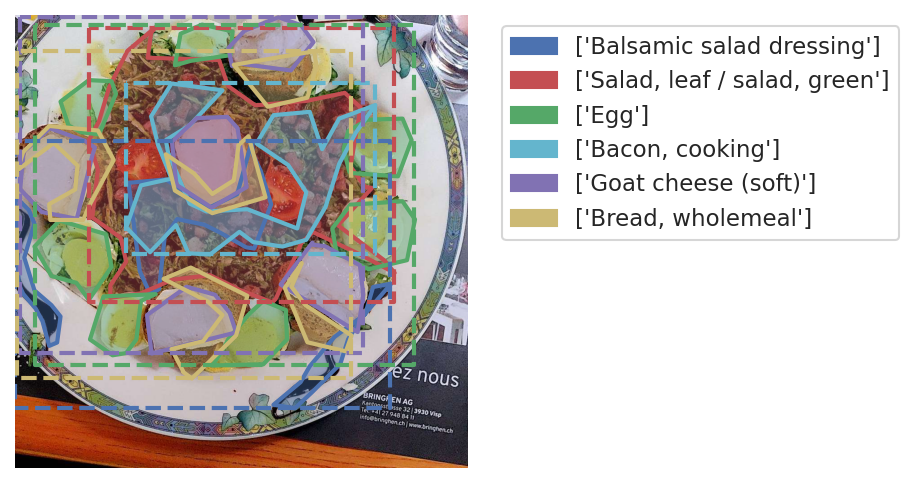

PREDICTION
len 9


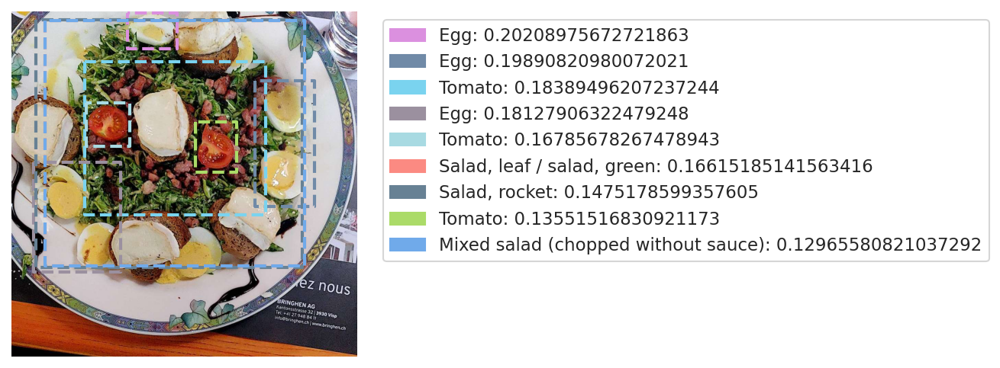

In [ ]:
# Test a single file
#"008675.jpg"
tested_file = "081088.jpg"
img_path = VAL_IMAGE_DIRECTORY + tested_file   #you can change this to any image you want!

# render groung truth
print("GROUND TRUTH")
# Note, this function is declared in "image visualization utils" section
render_img_from_filename(val_coco, val_annotations_data, my_file=tested_file, img_folder_path=VAL_IMAGE_DIRECTORY, render_ann=True, show_bbox=True)
# render prediction
print("PREDICTION")
render_img_from_imgid(cocoDt, val_annotations_data, results_annotations, my_file=tested_file, img_folder_path=VAL_IMAGE_DIRECTORY, render_ann=True, show_bbox=True, show_mask=False)